# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 36kB/s  eta 0:00:01   19% |██████▎                         | 2.9MB 39.7MB/s eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 19.0.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

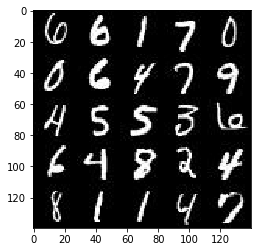

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

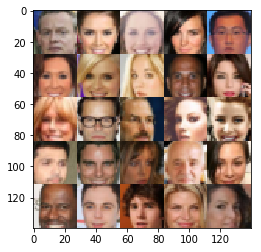

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="real_input")
    z_data = tf.placeholder(tf.float32, (None, z_dim), name="z_data")
    learning_rate = tf.placeholder(tf.float32, name="lr")
    

    return real_input, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        #print('images: ',images)
        l1 = tf.layers.conv2d(images, 64, 4, strides=2, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        l1 = tf.maximum(alpha * l1, l1)
        #print('l1: ', l1)
        
        l2 = tf.layers.conv2d(l1, 128, 4, strides=2, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        l2 = tf.layers.batch_normalization(l2, training=True)
        l2 = tf.maximum(alpha * l2, l2)
        l2 = tf.nn.dropout(l2, keep_prob=0.9)
        #print('l2: ', l2)
        
        l3 = tf.layers.conv2d(l2, 256, 4, strides=2, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        l3 = tf.layers.batch_normalization(l3, training=True)
        l3 = tf.maximum(alpha * l3, l3)
        l3 = tf.nn.dropout(l3, keep_prob=0.8)
        #print('l3: ', l3)
        
        #flattened = tf.contrib.layers.flatten(l3)
        flattened = tf.reshape(l3, (-1, 4*4*256))
        logits = tf.layers.dense(flattened, 1, activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        d1 = tf.layers.dense(z, 7*7*512, activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        print('d1: ', d1)
        
        l1 = tf.reshape(d1, (-1, 7, 7, 512))
        l1 = tf.layers.batch_normalization(l1, training=is_train)
        l1 = tf.maximum(alpha * l1, l1)
        l1 = tf.nn.dropout(l1, keep_prob=0.9)
        print('l1: ', l1)
        
        l2 = tf.layers.conv2d_transpose(l1, 256, 4, strides=2, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        l2 = tf.layers.batch_normalization(l2, training=is_train)
        l2 = tf.maximum(alpha * l2, l2)
        l2 = tf.nn.dropout(l2, keep_prob=0.8)
        print('l2: ', l2)

        l3 = tf.layers.conv2d_transpose(l2, 128, 4, strides=2, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        l3 = tf.layers.batch_normalization(l3, training=is_train)
        l3 = tf.maximum(alpha * l3, l3)
        l3 = tf.nn.dropout(l3, keep_prob=0.7)
        print('l3: ', l3)
        
        logits = tf.layers.conv2d_transpose(l3, out_channel_dim, 2, strides=1, padding='same', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        print('logits: ', logits)
        
        out = tf.tanh(logits)
        #print('out: ', out)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

d1:  Tensor("dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 5), dtype=float32)
d1:  Tensor("dense_2/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("dropout_3/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("dropout_4/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("dropout_5/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("conv2d_transpose_6/BiasAdd:0", shape=(?, 28, 28, 5), dtype=float32)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    smooth = 0.1
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

d1:  Tensor("generator/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 4), dtype=float32)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    all_vars = tf.trainable_variables()
    
    d_vars = [var for var in all_vars if 'discriminator' in var.name]
    g_vars = [var for var in all_vars if 'generator' in var.name]
    
    #print('all vars: ', len(all_vars), 'd_vars: ', len(d_vars), 'g_vars: ', len(g_vars))
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    channels = 1 if data_image_mode == 'L' else 3
    #print('channels: ', channels, 'data shape: ', data_shape)
    real_input, z_data, lr = model_inputs(data_shape[1], data_shape[2], channels, z_dim)
    #print('lr: ', lr, 'learning_rate:', learning_rate)
    d_loss, g_loss = model_loss(real_input, z_data, channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    batchnum = -1
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batchnum += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # https://github.com/soumith/ganhacks#3-use-a-spherical-z
                #batch_z = np.random.normal(0, scale=0.33, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={real_input: batch_images, z_data: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_input: batch_images, z_data: batch_z, lr: learning_rate})
                
                if batchnum % 100 == 0:
                    show_generator_output(sess, 25, z_data, channels, data_image_mode)
                    
                if batchnum % batch_size == 0:
                    print('Epoch: ', batchnum / batch_size)
                    print('d_loss: ', d_loss.eval(feed_dict={real_input: batch_images, z_data: batch_z, lr: learning_rate}))
                    print('g_loss: ', g_loss.eval(feed_dict={real_input: batch_images, z_data: batch_z, lr: learning_rate}))
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

d1:  Tensor("generator/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)
d1:  Tensor("generator_1/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_1/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_1/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_1/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_1/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


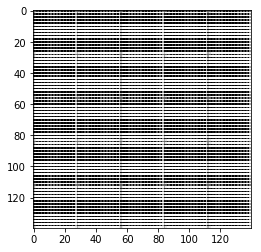

Epoch:  0.0
d_loss:  18.8857
g_loss:  3.25367e-07
Epoch:  1.0
d_loss:  2.48545
g_loss:  0.350554
Epoch:  2.0
d_loss:  2.68297
g_loss:  0.266865
Epoch:  3.0
d_loss:  0.835631
g_loss:  2.50935
d1:  Tensor("generator_2/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_2/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_2/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_2/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_2/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


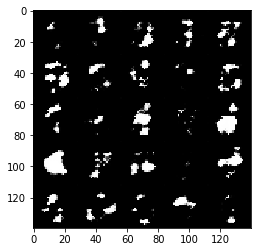

Epoch:  4.0
d_loss:  0.528067
g_loss:  2.29319
Epoch:  5.0
d_loss:  0.486487
g_loss:  4.47235
Epoch:  6.0
d_loss:  1.46782
g_loss:  2.64083
d1:  Tensor("generator_3/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_3/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_3/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_3/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_3/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


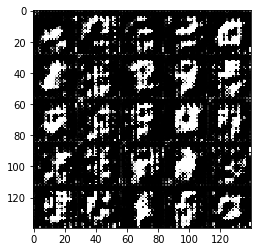

Epoch:  7.0
d_loss:  0.354261
g_loss:  3.98436
Epoch:  8.0
d_loss:  1.50551
g_loss:  0.491776
Epoch:  9.0
d_loss:  0.571925
g_loss:  2.11006
d1:  Tensor("generator_4/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_4/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_4/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_4/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_4/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


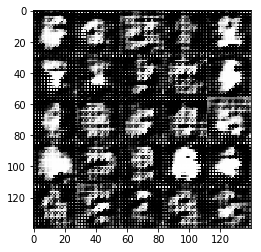

Epoch:  10.0
d_loss:  0.572035
g_loss:  1.70549
Epoch:  11.0
d_loss:  0.357813
g_loss:  3.77104
Epoch:  12.0
d_loss:  0.546692
g_loss:  4.22328
d1:  Tensor("generator_5/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_5/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_5/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_5/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_5/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


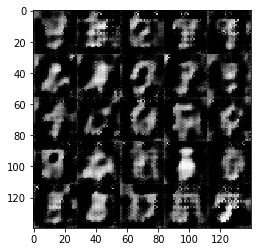

Epoch:  13.0
d_loss:  1.19448
g_loss:  0.661007
Epoch:  14.0
d_loss:  0.569811
g_loss:  1.93885
Epoch:  15.0
d_loss:  3.25855
g_loss:  0.0650565
d1:  Tensor("generator_6/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_6/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_6/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_6/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_6/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


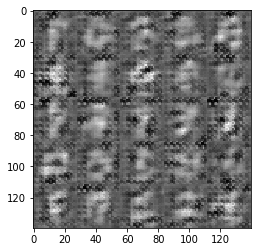

Epoch:  16.0
d_loss:  0.776023
g_loss:  1.31133
Epoch:  17.0
d_loss:  1.2523
g_loss:  1.63027
Epoch:  18.0
d_loss:  1.71742
g_loss:  0.308694
d1:  Tensor("generator_7/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_7/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_7/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_7/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_7/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


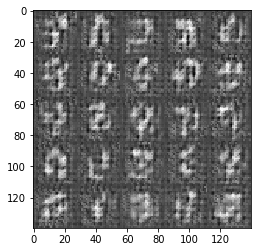

Epoch:  19.0
d_loss:  1.01003
g_loss:  0.756872
Epoch:  20.0
d_loss:  1.81051
g_loss:  0.312
Epoch:  21.0
d_loss:  0.893505
g_loss:  0.918906
d1:  Tensor("generator_8/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_8/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_8/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_8/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_8/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


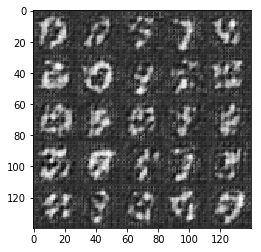

Epoch:  22.0
d_loss:  0.634932
g_loss:  1.56336
Epoch:  23.0
d_loss:  0.5686
g_loss:  2.25446
Epoch:  24.0
d_loss:  1.23649
g_loss:  1.02183
d1:  Tensor("generator_9/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_9/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_9/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_9/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_9/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


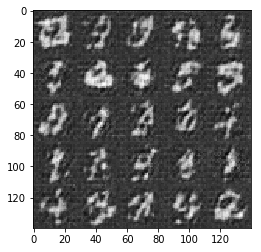

Epoch:  25.0
d_loss:  1.08975
g_loss:  1.26515
Epoch:  26.0
d_loss:  1.25438
g_loss:  0.593545
Epoch:  27.0
d_loss:  0.466341
g_loss:  2.57634
Epoch:  28.0
d_loss:  1.09926
g_loss:  0.688863
d1:  Tensor("generator_10/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_10/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_10/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_10/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_10/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


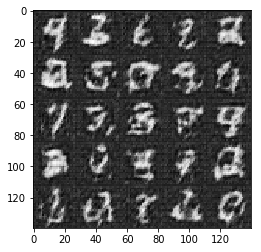

Epoch:  29.0
d_loss:  0.882206
g_loss:  1.19595
Epoch:  30.0
d_loss:  0.559554
g_loss:  1.79359
Epoch:  31.0
d_loss:  0.393791
g_loss:  3.18379
d1:  Tensor("generator_11/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_11/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_11/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_11/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_11/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


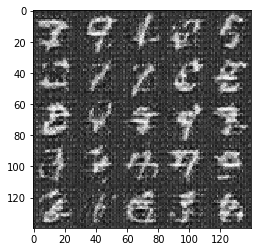

Epoch:  32.0
d_loss:  1.39734
g_loss:  0.481786
Epoch:  33.0
d_loss:  1.02432
g_loss:  0.812369
Epoch:  34.0
d_loss:  0.852496
g_loss:  2.31952
d1:  Tensor("generator_12/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_12/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_12/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_12/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_12/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


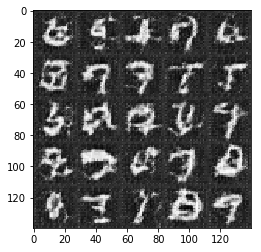

Epoch:  35.0
d_loss:  0.852696
g_loss:  1.49414
Epoch:  36.0
d_loss:  1.02516
g_loss:  1.22199
Epoch:  37.0
d_loss:  0.497878
g_loss:  3.42035
d1:  Tensor("generator_13/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_13/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_13/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_13/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_13/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


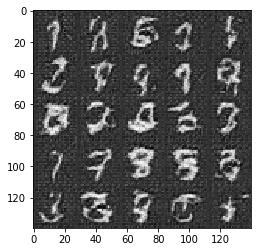

Epoch:  38.0
d_loss:  0.479524
g_loss:  2.52902
Epoch:  39.0
d_loss:  0.53908
g_loss:  3.47594
Epoch:  40.0
d_loss:  0.860309
g_loss:  1.09579
d1:  Tensor("generator_14/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_14/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_14/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_14/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_14/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


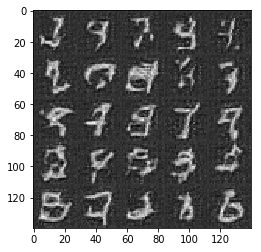

Epoch:  41.0
d_loss:  0.513496
g_loss:  2.00732
Epoch:  42.0
d_loss:  0.773617
g_loss:  4.25647
Epoch:  43.0
d_loss:  1.60832
g_loss:  0.372337
d1:  Tensor("generator_15/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_15/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_15/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_15/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_15/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


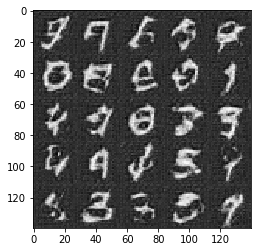

Epoch:  44.0
d_loss:  0.474979
g_loss:  2.37966
Epoch:  45.0
d_loss:  0.747109
g_loss:  1.32711
Epoch:  46.0
d_loss:  1.15623
g_loss:  0.63574
d1:  Tensor("generator_16/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_16/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_16/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_16/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_16/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


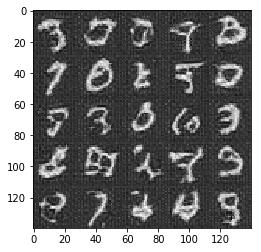

Epoch:  47.0
d_loss:  0.374749
g_loss:  4.75275
Epoch:  48.0
d_loss:  0.75188
g_loss:  1.23177
Epoch:  49.0
d_loss:  0.380168
g_loss:  3.37548
d1:  Tensor("generator_17/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_17/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_17/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_17/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_17/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


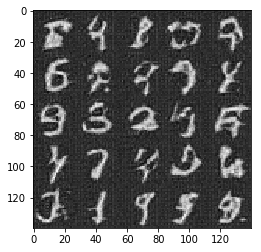

Epoch:  50.0
d_loss:  0.818043
g_loss:  1.43006
Epoch:  51.0
d_loss:  3.11974
g_loss:  0.113526
Epoch:  52.0
d_loss:  0.450964
g_loss:  2.43921
Epoch:  53.0
d_loss:  2.25244
g_loss:  0.202884
d1:  Tensor("generator_18/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_18/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_18/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_18/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_18/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


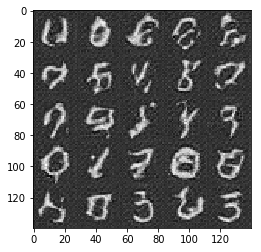

Epoch:  54.0
d_loss:  0.855092
g_loss:  1.09727
Epoch:  55.0
d_loss:  0.647403
g_loss:  1.52638
Epoch:  56.0
d_loss:  1.03413
g_loss:  0.892795
d1:  Tensor("generator_19/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_19/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_19/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_19/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_19/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


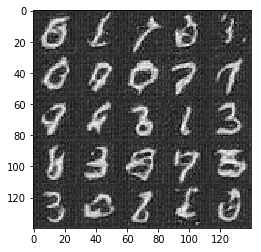

Epoch:  57.0
d_loss:  1.49936
g_loss:  0.470704
Epoch:  58.0
d_loss:  0.393259
g_loss:  3.00278
Epoch:  59.0
d_loss:  0.374697
g_loss:  4.90927
d1:  Tensor("generator_20/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_20/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_20/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_20/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_20/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


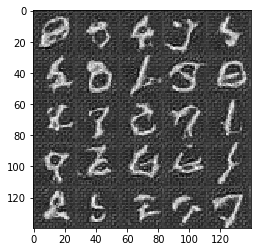

Epoch:  60.0
d_loss:  1.75504
g_loss:  0.434848
Epoch:  61.0
d_loss:  0.410307
g_loss:  2.88009
Epoch:  62.0
d_loss:  0.377274
g_loss:  4.01554
d1:  Tensor("generator_21/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_21/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_21/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_21/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_21/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


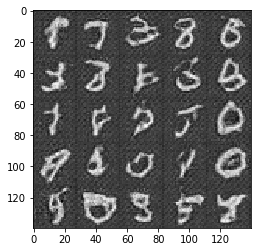

Epoch:  63.0
d_loss:  1.73324
g_loss:  0.370258
Epoch:  64.0
d_loss:  0.377028
g_loss:  3.66766
Epoch:  65.0
d_loss:  1.26837
g_loss:  2.14525
d1:  Tensor("generator_22/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_22/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_22/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_22/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_22/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


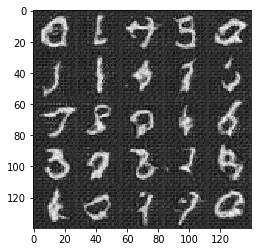

Epoch:  66.0
d_loss:  0.7996
g_loss:  1.1476
Epoch:  67.0
d_loss:  0.485314
g_loss:  2.41073
Epoch:  68.0
d_loss:  0.958715
g_loss:  0.981389
d1:  Tensor("generator_23/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_23/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_23/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_23/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_23/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


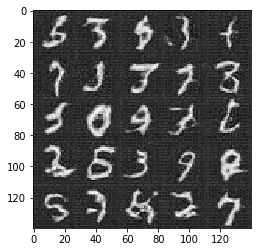

Epoch:  69.0
d_loss:  1.9681
g_loss:  0.310376
Epoch:  70.0
d_loss:  1.01874
g_loss:  0.816038
Epoch:  71.0
d_loss:  1.17276
g_loss:  0.67717
d1:  Tensor("generator_24/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_24/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_24/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_24/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_24/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


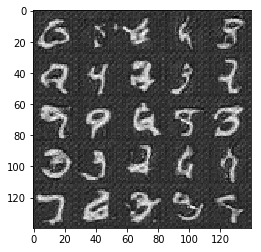

Epoch:  72.0
d_loss:  0.379989
g_loss:  3.34701
Epoch:  73.0
d_loss:  0.350772
g_loss:  4.88462
Epoch:  74.0
d_loss:  0.824418
g_loss:  1.28956
d1:  Tensor("generator_25/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_25/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_25/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_25/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_25/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


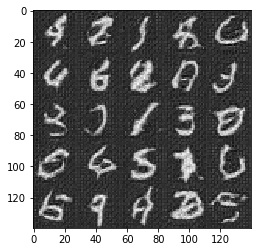

Epoch:  75.0
d_loss:  1.64176
g_loss:  2.13693
Epoch:  76.0
d_loss:  1.04092
g_loss:  0.958142
Epoch:  77.0
d_loss:  0.508426
g_loss:  2.25205
Epoch:  78.0
d_loss:  0.501903
g_loss:  2.22743
d1:  Tensor("generator_26/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_26/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_26/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_26/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_26/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


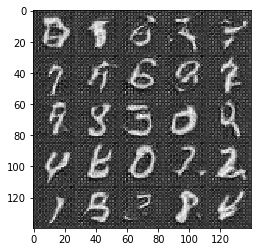

Epoch:  79.0
d_loss:  0.85553
g_loss:  1.09844
Epoch:  80.0
d_loss:  0.382574
g_loss:  3.87302
Epoch:  81.0
d_loss:  0.519128
g_loss:  2.26497
d1:  Tensor("generator_27/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_27/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_27/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_27/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_27/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


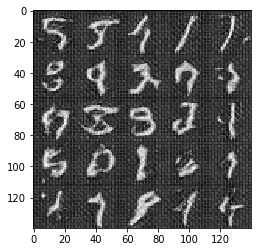

Epoch:  82.0
d_loss:  0.768283
g_loss:  1.76888
Epoch:  83.0
d_loss:  1.0675
g_loss:  2.0887
Epoch:  84.0
d_loss:  2.21862
g_loss:  2.35892
d1:  Tensor("generator_28/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_28/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_28/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_28/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_28/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


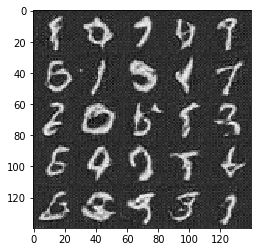

Epoch:  85.0
d_loss:  0.367937
g_loss:  4.42956
Epoch:  86.0
d_loss:  1.23908
g_loss:  0.723191
Epoch:  87.0
d_loss:  0.623407
g_loss:  1.54847
d1:  Tensor("generator_29/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_29/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_29/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_29/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_29/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


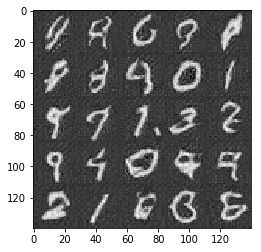

Epoch:  88.0
d_loss:  0.924093
g_loss:  1.04725
Epoch:  89.0
d_loss:  0.853689
g_loss:  1.0095
Epoch:  90.0
d_loss:  0.351627
g_loss:  4.25543
d1:  Tensor("generator_30/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_30/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_30/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_30/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_30/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


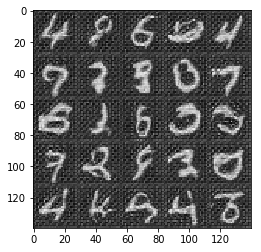

Epoch:  91.0
d_loss:  0.649893
g_loss:  2.09617
Epoch:  92.0
d_loss:  0.925314
g_loss:  2.4434
Epoch:  93.0
d_loss:  1.15661
g_loss:  0.682383
d1:  Tensor("generator_31/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_31/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_31/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_31/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_31/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


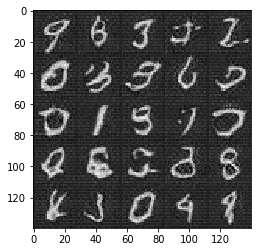

Epoch:  94.0
d_loss:  0.657764
g_loss:  1.72813
Epoch:  95.0
d_loss:  0.765773
g_loss:  1.26961
Epoch:  96.0
d_loss:  1.14946
g_loss:  0.78923
d1:  Tensor("generator_32/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_32/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_32/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_32/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_32/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


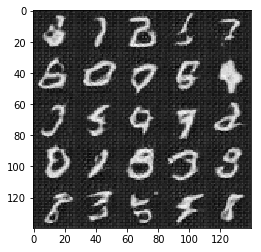

Epoch:  97.0
d_loss:  2.74929
g_loss:  3.64483
Epoch:  98.0
d_loss:  1.56774
g_loss:  0.490622
Epoch:  99.0
d_loss:  0.96834
g_loss:  1.72555
d1:  Tensor("generator_33/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_33/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_33/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_33/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_33/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


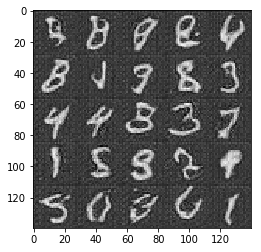

Epoch:  100.0
d_loss:  0.562161
g_loss:  2.58017
Epoch:  101.0
d_loss:  0.486693
g_loss:  2.99068
Epoch:  102.0
d_loss:  3.05373
g_loss:  4.98036
Epoch:  103.0
d_loss:  1.00844
g_loss:  0.953439
d1:  Tensor("generator_34/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_34/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_34/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_34/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_34/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


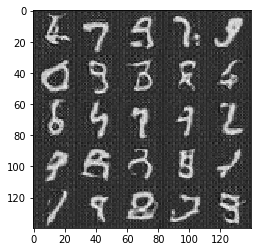

Epoch:  104.0
d_loss:  1.10277
g_loss:  0.797797
Epoch:  105.0
d_loss:  0.455278
g_loss:  2.41526
Epoch:  106.0
d_loss:  0.775829
g_loss:  1.16414
d1:  Tensor("generator_35/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_35/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_35/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_35/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_35/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


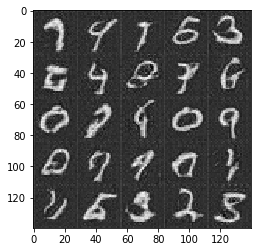

Epoch:  107.0
d_loss:  0.404879
g_loss:  4.01064
Epoch:  108.0
d_loss:  0.363227
g_loss:  5.05412
Epoch:  109.0
d_loss:  1.22708
g_loss:  0.650533
d1:  Tensor("generator_36/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_36/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_36/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_36/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_36/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


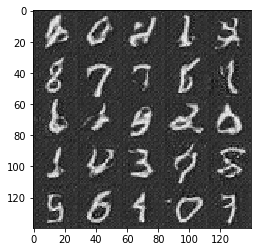

Epoch:  110.0
d_loss:  0.429892
g_loss:  3.96965
Epoch:  111.0
d_loss:  0.486431
g_loss:  2.33738
Epoch:  112.0
d_loss:  0.593805
g_loss:  2.11858
d1:  Tensor("generator_37/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_37/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_37/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_37/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_37/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


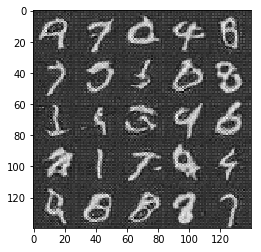

Epoch:  113.0
d_loss:  1.32636
g_loss:  2.98377
Epoch:  114.0
d_loss:  0.452686
g_loss:  3.13296
Epoch:  115.0
d_loss:  1.03023
g_loss:  0.793679
d1:  Tensor("generator_38/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_38/Maximum:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_38/Maximum_1:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_38/Maximum_2:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_38/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 1), dtype=float32)


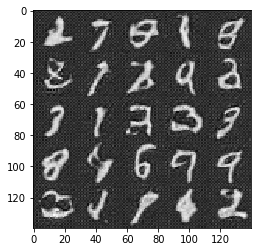

Epoch:  116.0
d_loss:  2.52495
g_loss:  0.200623
Epoch:  117.0
d_loss:  0.368912
g_loss:  4.27043


In [30]:
batch_size = 32
z_dim = 128
learning_rate = .01
beta1 = .2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

d1:  Tensor("generator/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)
d1:  Tensor("generator_1/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_1/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_1/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_1/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_1/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


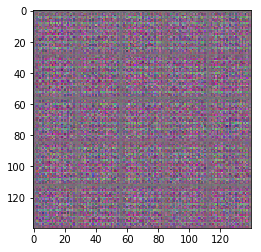

Epoch:  0.0
d_loss:  4.71003
g_loss:  0.0861459
Epoch:  1.0
d_loss:  1.74294
g_loss:  1.08038
Epoch:  2.0
d_loss:  1.34031
g_loss:  0.923506
Epoch:  3.0
d_loss:  1.73579
g_loss:  0.621198
Epoch:  4.0
d_loss:  0.485799
g_loss:  2.92293
Epoch:  5.0
d_loss:  0.354457
g_loss:  4.15004
Epoch:  6.0
d_loss:  0.415778
g_loss:  3.7959
d1:  Tensor("generator_2/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_2/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_2/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_2/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_2/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


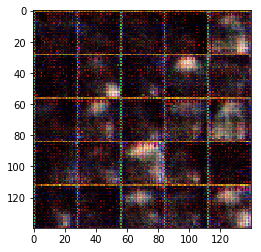

Epoch:  7.0
d_loss:  1.50531
g_loss:  0.701761
Epoch:  8.0
d_loss:  0.505418
g_loss:  2.73239
Epoch:  9.0
d_loss:  0.538492
g_loss:  2.1749
Epoch:  10.0
d_loss:  0.984149
g_loss:  1.6103
Epoch:  11.0
d_loss:  0.398878
g_loss:  3.10917
Epoch:  12.0
d_loss:  0.442819
g_loss:  2.46164
d1:  Tensor("generator_3/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_3/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_3/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_3/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_3/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


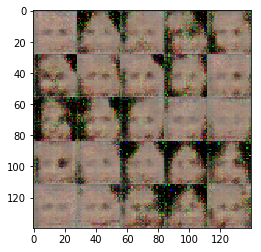

Epoch:  13.0
d_loss:  4.68874
g_loss:  0.0368962
Epoch:  14.0
d_loss:  1.0584
g_loss:  3.36739
Epoch:  15.0
d_loss:  0.411687
g_loss:  3.20728
Epoch:  16.0
d_loss:  1.46685
g_loss:  2.28039
Epoch:  17.0
d_loss:  0.747508
g_loss:  2.90682
Epoch:  18.0
d_loss:  0.702435
g_loss:  1.69535
d1:  Tensor("generator_4/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_4/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_4/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_4/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_4/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


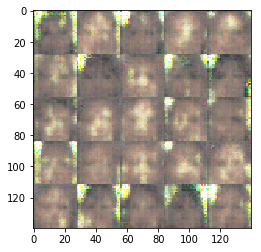

Epoch:  19.0
d_loss:  0.415568
g_loss:  3.00224
Epoch:  20.0
d_loss:  0.619803
g_loss:  2.02375
Epoch:  21.0
d_loss:  1.11037
g_loss:  0.872987
Epoch:  22.0
d_loss:  0.804136
g_loss:  1.84074
Epoch:  23.0
d_loss:  0.865313
g_loss:  1.80673
Epoch:  24.0
d_loss:  1.66182
g_loss:  0.451332
d1:  Tensor("generator_5/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_5/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_5/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_5/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_5/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


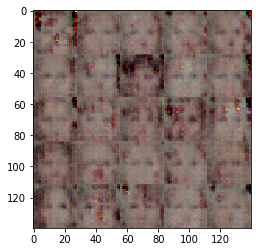

Epoch:  25.0
d_loss:  1.74043
g_loss:  0.714065
Epoch:  26.0
d_loss:  0.89849
g_loss:  0.849863
Epoch:  27.0
d_loss:  0.872373
g_loss:  1.82863
Epoch:  28.0
d_loss:  0.365346
g_loss:  5.98713
Epoch:  29.0
d_loss:  0.601374
g_loss:  2.77957
Epoch:  30.0
d_loss:  1.06059
g_loss:  0.989315
Epoch:  31.0
d_loss:  2.52481
g_loss:  1.827
d1:  Tensor("generator_6/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_6/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_6/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_6/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_6/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


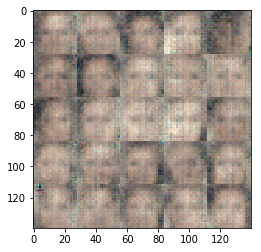

Epoch:  32.0
d_loss:  1.68554
g_loss:  0.439589
Epoch:  33.0
d_loss:  1.55919
g_loss:  0.558865
Epoch:  34.0
d_loss:  1.619
g_loss:  0.36291
Epoch:  35.0
d_loss:  1.40035
g_loss:  0.964076
Epoch:  36.0
d_loss:  1.73852
g_loss:  0.454603
Epoch:  37.0
d_loss:  1.51529
g_loss:  0.417012
d1:  Tensor("generator_7/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_7/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_7/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_7/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_7/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


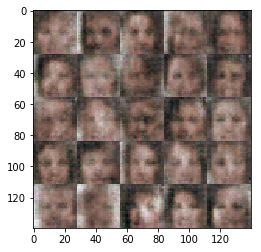

Epoch:  38.0
d_loss:  1.56051
g_loss:  0.786359
Epoch:  39.0
d_loss:  1.72963
g_loss:  0.458734
Epoch:  40.0
d_loss:  1.95493
g_loss:  0.206661
Epoch:  41.0
d_loss:  1.35251
g_loss:  0.62549
Epoch:  42.0
d_loss:  2.18122
g_loss:  0.330795
Epoch:  43.0
d_loss:  1.15154
g_loss:  0.926662
d1:  Tensor("generator_8/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_8/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_8/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_8/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_8/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


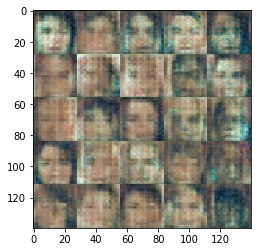

Epoch:  44.0
d_loss:  2.14295
g_loss:  0.219818
Epoch:  45.0
d_loss:  2.13887
g_loss:  0.265819
Epoch:  46.0
d_loss:  1.34482
g_loss:  0.799943
Epoch:  47.0
d_loss:  1.79692
g_loss:  0.289668
Epoch:  48.0
d_loss:  1.62587
g_loss:  1.00783
Epoch:  49.0
d_loss:  1.82013
g_loss:  0.398326
d1:  Tensor("generator_9/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_9/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_9/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_9/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_9/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


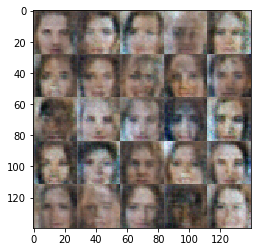

Epoch:  50.0
d_loss:  1.29685
g_loss:  0.846159
Epoch:  51.0
d_loss:  1.25666
g_loss:  0.922884
Epoch:  52.0
d_loss:  1.44345
g_loss:  0.570554
Epoch:  53.0
d_loss:  1.10065
g_loss:  1.47504
Epoch:  54.0
d_loss:  1.37006
g_loss:  0.757636
Epoch:  55.0
d_loss:  1.29136
g_loss:  0.630075
Epoch:  56.0
d_loss:  1.2907
g_loss:  0.73927
d1:  Tensor("generator_10/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_10/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_10/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_10/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_10/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


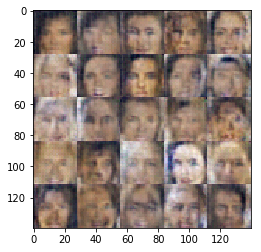

Epoch:  57.0
d_loss:  1.43071
g_loss:  0.68286
Epoch:  58.0
d_loss:  1.4171
g_loss:  0.597686
Epoch:  59.0
d_loss:  1.28892
g_loss:  0.68035
Epoch:  60.0
d_loss:  1.61585
g_loss:  0.520318
Epoch:  61.0
d_loss:  1.45074
g_loss:  0.654936
Epoch:  62.0
d_loss:  1.35036
g_loss:  0.617813
d1:  Tensor("generator_11/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_11/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_11/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_11/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_11/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


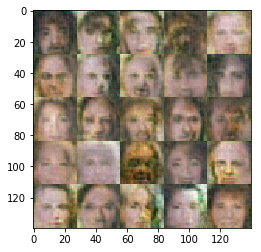

Epoch:  63.0
d_loss:  1.45146
g_loss:  0.560289
Epoch:  64.0
d_loss:  1.35546
g_loss:  0.686684
Epoch:  65.0
d_loss:  1.35982
g_loss:  0.806738
Epoch:  66.0
d_loss:  1.48105
g_loss:  0.586503
Epoch:  67.0
d_loss:  1.36407
g_loss:  0.901688
Epoch:  68.0
d_loss:  1.29571
g_loss:  0.595215
d1:  Tensor("generator_12/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_12/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_12/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_12/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_12/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


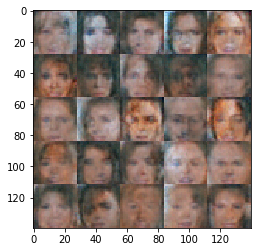

Epoch:  69.0
d_loss:  1.38166
g_loss:  0.87201
Epoch:  70.0
d_loss:  1.71564
g_loss:  0.544068
Epoch:  71.0
d_loss:  1.35244
g_loss:  0.838142
Epoch:  72.0
d_loss:  1.29606
g_loss:  1.00322
Epoch:  73.0
d_loss:  1.49431
g_loss:  0.592767
Epoch:  74.0
d_loss:  1.5452
g_loss:  1.01657
d1:  Tensor("generator_13/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_13/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_13/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_13/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_13/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


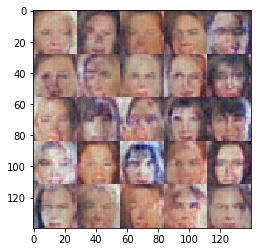

Epoch:  75.0
d_loss:  1.16304
g_loss:  0.746674
Epoch:  76.0
d_loss:  1.49735
g_loss:  1.39236
Epoch:  77.0
d_loss:  1.43671
g_loss:  0.930647
Epoch:  78.0
d_loss:  1.14104
g_loss:  1.28175
Epoch:  79.0
d_loss:  1.80052
g_loss:  0.255056
Epoch:  80.0
d_loss:  1.19115
g_loss:  0.941727
Epoch:  81.0
d_loss:  1.46109
g_loss:  0.770242
d1:  Tensor("generator_14/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_14/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_14/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_14/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_14/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


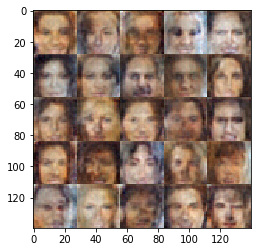

Epoch:  82.0
d_loss:  1.2182
g_loss:  0.713765
Epoch:  83.0
d_loss:  1.29475
g_loss:  0.672259
Epoch:  84.0
d_loss:  1.4476
g_loss:  0.58714
Epoch:  85.0
d_loss:  1.36919
g_loss:  0.591645
Epoch:  86.0
d_loss:  1.08723
g_loss:  1.29076
Epoch:  87.0
d_loss:  1.15618
g_loss:  2.56278
d1:  Tensor("generator_15/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_15/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_15/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_15/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_15/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


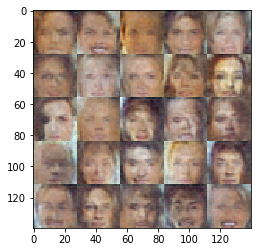

Epoch:  88.0
d_loss:  1.37
g_loss:  0.657383
Epoch:  89.0
d_loss:  1.72043
g_loss:  0.417455
Epoch:  90.0
d_loss:  1.33495
g_loss:  1.0213
Epoch:  91.0
d_loss:  1.26402
g_loss:  0.696501
Epoch:  92.0
d_loss:  1.62039
g_loss:  1.21795
Epoch:  93.0
d_loss:  1.47758
g_loss:  1.16166
d1:  Tensor("generator_16/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_16/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_16/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_16/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_16/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


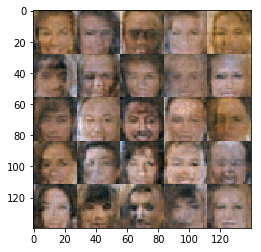

Epoch:  94.0
d_loss:  1.53937
g_loss:  0.432919
Epoch:  95.0
d_loss:  1.41311
g_loss:  0.691903
Epoch:  96.0
d_loss:  1.48372
g_loss:  0.917741
Epoch:  97.0
d_loss:  1.50917
g_loss:  0.760262
Epoch:  98.0
d_loss:  1.27916
g_loss:  0.750973
Epoch:  99.0
d_loss:  1.35698
g_loss:  0.656615
d1:  Tensor("generator_17/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_17/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_17/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_17/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_17/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


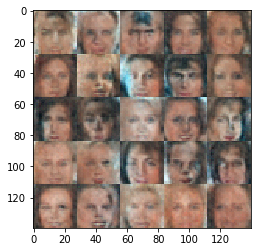

Epoch:  100.0
d_loss:  1.30606
g_loss:  0.811212
Epoch:  101.0
d_loss:  1.29161
g_loss:  0.736421
Epoch:  102.0
d_loss:  1.72485
g_loss:  0.319126
Epoch:  103.0
d_loss:  1.81027
g_loss:  1.40753
Epoch:  104.0
d_loss:  1.4794
g_loss:  0.439243
Epoch:  105.0
d_loss:  1.33245
g_loss:  0.830549
Epoch:  106.0
d_loss:  1.3593
g_loss:  0.757197
d1:  Tensor("generator_18/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_18/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_18/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_18/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_18/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


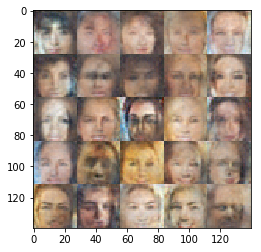

Epoch:  107.0
d_loss:  1.19866
g_loss:  0.782091
Epoch:  108.0
d_loss:  1.31367
g_loss:  0.974011
Epoch:  109.0
d_loss:  1.32324
g_loss:  0.699946
Epoch:  110.0
d_loss:  1.08381
g_loss:  0.843761
Epoch:  111.0
d_loss:  1.82051
g_loss:  1.30463
Epoch:  112.0
d_loss:  1.43341
g_loss:  0.804576
d1:  Tensor("generator_19/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_19/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_19/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_19/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_19/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


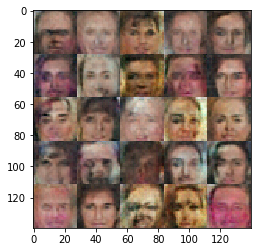

Epoch:  113.0
d_loss:  1.80522
g_loss:  0.948428
Epoch:  114.0
d_loss:  1.17966
g_loss:  0.972701
Epoch:  115.0
d_loss:  1.82817
g_loss:  0.324829
Epoch:  116.0
d_loss:  1.43142
g_loss:  0.758691
Epoch:  117.0
d_loss:  1.36679
g_loss:  0.537656
Epoch:  118.0
d_loss:  1.37691
g_loss:  0.692249
d1:  Tensor("generator_20/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_20/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_20/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_20/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_20/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


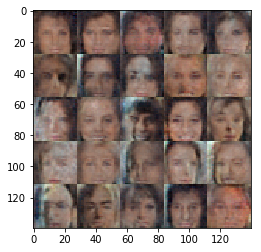

Epoch:  119.0
d_loss:  1.33613
g_loss:  1.18097
Epoch:  120.0
d_loss:  1.142
g_loss:  1.09558
Epoch:  121.0
d_loss:  1.31445
g_loss:  0.579292
Epoch:  122.0
d_loss:  1.31877
g_loss:  0.7365
Epoch:  123.0
d_loss:  1.34047
g_loss:  0.823149
Epoch:  124.0
d_loss:  1.16942
g_loss:  0.873463
d1:  Tensor("generator_21/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_21/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_21/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_21/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_21/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


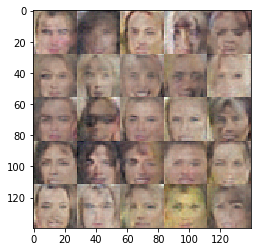

Epoch:  125.0
d_loss:  1.53265
g_loss:  0.468341
Epoch:  126.0
d_loss:  1.55766
g_loss:  0.681851
Epoch:  127.0
d_loss:  1.30722
g_loss:  0.760215
Epoch:  128.0
d_loss:  1.64962
g_loss:  0.496375
Epoch:  129.0
d_loss:  1.48713
g_loss:  0.609698
Epoch:  130.0
d_loss:  1.32825
g_loss:  0.803468
Epoch:  131.0
d_loss:  1.47971
g_loss:  0.79775
d1:  Tensor("generator_22/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_22/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_22/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_22/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_22/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


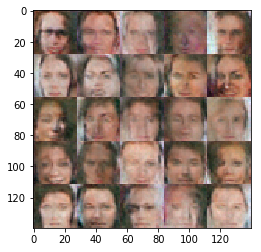

Epoch:  132.0
d_loss:  1.12958
g_loss:  0.700624
Epoch:  133.0
d_loss:  1.17591
g_loss:  0.833856
Epoch:  134.0
d_loss:  1.37827
g_loss:  0.576465
Epoch:  135.0
d_loss:  1.39567
g_loss:  0.693876
Epoch:  136.0
d_loss:  1.36043
g_loss:  0.478007
Epoch:  137.0
d_loss:  1.50126
g_loss:  0.693827
d1:  Tensor("generator_23/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_23/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_23/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_23/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_23/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


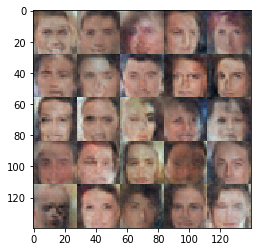

Epoch:  138.0
d_loss:  1.48472
g_loss:  0.655021
Epoch:  139.0
d_loss:  1.29917
g_loss:  0.729922
Epoch:  140.0
d_loss:  1.17838
g_loss:  0.59897
Epoch:  141.0
d_loss:  1.41234
g_loss:  0.716738
Epoch:  142.0
d_loss:  1.54425
g_loss:  0.471324
Epoch:  143.0
d_loss:  1.5122
g_loss:  0.581132
d1:  Tensor("generator_24/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_24/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_24/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_24/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_24/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


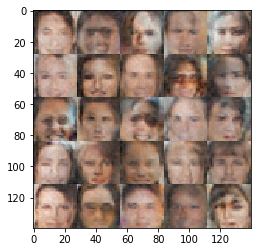

Epoch:  144.0
d_loss:  1.25292
g_loss:  0.661784
Epoch:  145.0
d_loss:  1.53562
g_loss:  0.502233
Epoch:  146.0
d_loss:  1.53157
g_loss:  0.521792
Epoch:  147.0
d_loss:  1.39389
g_loss:  0.559992
Epoch:  148.0
d_loss:  1.88758
g_loss:  0.281251
Epoch:  149.0
d_loss:  1.91202
g_loss:  0.263044
d1:  Tensor("generator_25/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_25/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_25/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_25/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_25/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


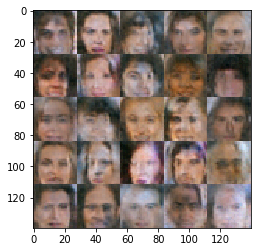

Epoch:  150.0
d_loss:  1.10149
g_loss:  1.05588
Epoch:  151.0
d_loss:  1.50393
g_loss:  0.58671
Epoch:  152.0
d_loss:  1.61592
g_loss:  0.367247
Epoch:  153.0
d_loss:  1.39828
g_loss:  0.645625
Epoch:  154.0
d_loss:  1.4186
g_loss:  0.534683
Epoch:  155.0
d_loss:  1.59712
g_loss:  0.43097
Epoch:  156.0
d_loss:  1.4025
g_loss:  0.528541
d1:  Tensor("generator_26/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_26/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_26/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_26/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_26/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


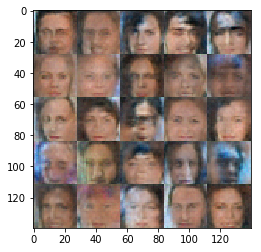

Epoch:  157.0
d_loss:  1.22124
g_loss:  0.973893
Epoch:  158.0
d_loss:  1.41626
g_loss:  1.00361
Epoch:  159.0
d_loss:  1.47549
g_loss:  0.754248
Epoch:  160.0
d_loss:  1.40638
g_loss:  1.27556
Epoch:  161.0
d_loss:  1.43573
g_loss:  0.598464
Epoch:  162.0
d_loss:  1.89288
g_loss:  0.307213
d1:  Tensor("generator_27/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_27/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_27/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_27/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_27/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


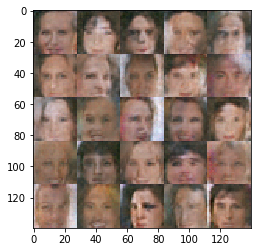

Epoch:  163.0
d_loss:  1.58849
g_loss:  1.20294
Epoch:  164.0
d_loss:  1.16089
g_loss:  0.912377
Epoch:  165.0
d_loss:  1.40752
g_loss:  0.693058
Epoch:  166.0
d_loss:  1.59283
g_loss:  0.572918
Epoch:  167.0
d_loss:  1.58676
g_loss:  0.451698
Epoch:  168.0
d_loss:  1.20075
g_loss:  0.706211
d1:  Tensor("generator_28/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_28/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_28/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_28/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_28/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


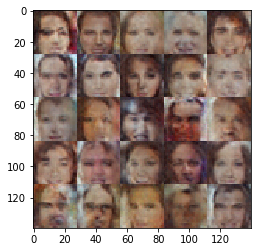

Epoch:  169.0
d_loss:  1.40929
g_loss:  0.737666
Epoch:  170.0
d_loss:  1.5098
g_loss:  0.913722
Epoch:  171.0
d_loss:  1.17122
g_loss:  0.942778
Epoch:  172.0
d_loss:  1.40245
g_loss:  0.458881
Epoch:  173.0
d_loss:  1.33026
g_loss:  0.563303
Epoch:  174.0
d_loss:  1.6639
g_loss:  0.44679
d1:  Tensor("generator_29/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_29/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_29/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_29/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_29/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


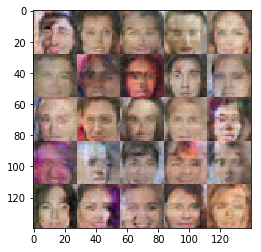

Epoch:  175.0
d_loss:  1.62217
g_loss:  0.347745
Epoch:  176.0
d_loss:  1.25083
g_loss:  0.668153
Epoch:  177.0
d_loss:  1.06776
g_loss:  1.12965
Epoch:  178.0
d_loss:  1.25855
g_loss:  0.656711
Epoch:  179.0
d_loss:  1.27304
g_loss:  0.624157
Epoch:  180.0
d_loss:  1.27049
g_loss:  1.00939
Epoch:  181.0
d_loss:  1.77519
g_loss:  0.329609
d1:  Tensor("generator_30/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_30/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_30/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_30/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_30/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


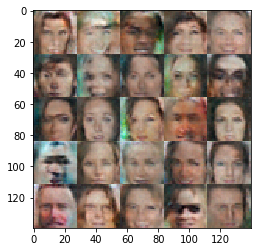

Epoch:  182.0
d_loss:  1.41582
g_loss:  0.43057
Epoch:  183.0
d_loss:  1.30299
g_loss:  0.856299
Epoch:  184.0
d_loss:  1.30918
g_loss:  0.639561
Epoch:  185.0
d_loss:  1.29076
g_loss:  0.80751
Epoch:  186.0
d_loss:  1.4827
g_loss:  1.29136
Epoch:  187.0
d_loss:  1.46025
g_loss:  0.68228
d1:  Tensor("generator_31/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_31/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_31/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_31/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_31/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


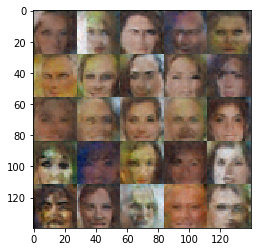

Epoch:  188.0
d_loss:  1.66174
g_loss:  0.410453
Epoch:  189.0
d_loss:  1.3851
g_loss:  0.711083
Epoch:  190.0
d_loss:  1.26447
g_loss:  0.986069
Epoch:  191.0
d_loss:  1.45823
g_loss:  0.563536
Epoch:  192.0
d_loss:  1.2334
g_loss:  1.15214
Epoch:  193.0
d_loss:  1.32495
g_loss:  1.10411
d1:  Tensor("generator_32/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_32/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_32/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_32/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_32/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


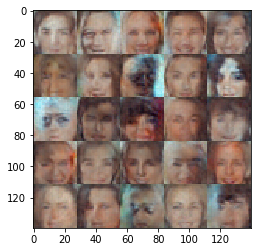

Epoch:  194.0
d_loss:  1.40706
g_loss:  0.656551
Epoch:  195.0
d_loss:  1.41234
g_loss:  0.682131
Epoch:  196.0
d_loss:  1.32695
g_loss:  0.559782
Epoch:  197.0
d_loss:  1.37538
g_loss:  0.868279
Epoch:  198.0
d_loss:  1.10051
g_loss:  0.976572
Epoch:  199.0
d_loss:  1.16792
g_loss:  0.796893
d1:  Tensor("generator_33/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_33/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_33/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_33/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_33/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


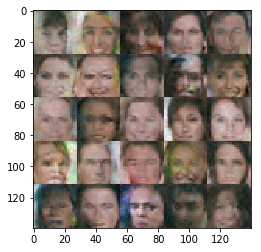

Epoch:  200.0
d_loss:  1.29455
g_loss:  0.8014
Epoch:  201.0
d_loss:  1.42502
g_loss:  0.635819
Epoch:  202.0
d_loss:  1.16203
g_loss:  0.733477
Epoch:  203.0
d_loss:  1.15087
g_loss:  0.964848
Epoch:  204.0
d_loss:  1.82198
g_loss:  0.290993
Epoch:  205.0
d_loss:  1.76205
g_loss:  0.321485
Epoch:  206.0
d_loss:  1.26701
g_loss:  1.06429
d1:  Tensor("generator_34/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_34/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_34/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_34/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_34/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


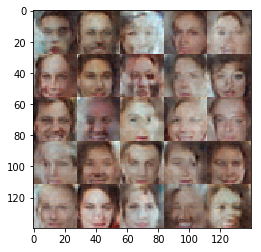

Epoch:  207.0
d_loss:  1.47802
g_loss:  0.428944
Epoch:  208.0
d_loss:  1.55835
g_loss:  0.339488
Epoch:  209.0
d_loss:  1.2008
g_loss:  0.773333
Epoch:  210.0
d_loss:  1.50265
g_loss:  0.512764
Epoch:  211.0
d_loss:  1.31793
g_loss:  0.531191
Epoch:  212.0
d_loss:  1.47389
g_loss:  0.564463
d1:  Tensor("generator_35/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_35/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_35/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_35/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_35/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


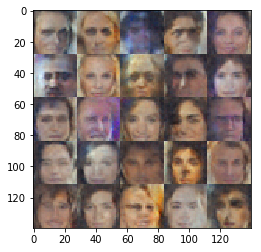

Epoch:  213.0
d_loss:  1.54228
g_loss:  0.559858
Epoch:  214.0
d_loss:  1.7545
g_loss:  0.39235
Epoch:  215.0
d_loss:  1.2034
g_loss:  0.896584
Epoch:  216.0
d_loss:  1.3843
g_loss:  0.605561
Epoch:  217.0
d_loss:  1.28729
g_loss:  0.573187
Epoch:  218.0
d_loss:  1.39618
g_loss:  0.576787
d1:  Tensor("generator_36/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_36/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_36/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_36/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_36/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


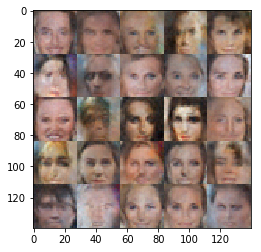

Epoch:  219.0
d_loss:  1.13281
g_loss:  0.879104
Epoch:  220.0
d_loss:  1.28993
g_loss:  0.628887
Epoch:  221.0
d_loss:  1.21382
g_loss:  0.856857
Epoch:  222.0
d_loss:  1.73835
g_loss:  0.389669
Epoch:  223.0
d_loss:  1.28645
g_loss:  0.734932
Epoch:  224.0
d_loss:  1.19213
g_loss:  0.750082
d1:  Tensor("generator_37/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_37/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_37/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_37/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_37/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


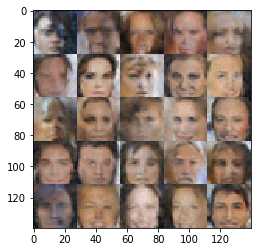

Epoch:  225.0
d_loss:  1.58258
g_loss:  0.367789
Epoch:  226.0
d_loss:  1.16044
g_loss:  0.739663
Epoch:  227.0
d_loss:  1.03511
g_loss:  1.11151
Epoch:  228.0
d_loss:  1.49546
g_loss:  0.576641
Epoch:  229.0
d_loss:  1.24338
g_loss:  0.691137
Epoch:  230.0
d_loss:  1.31017
g_loss:  1.38276
Epoch:  231.0
d_loss:  1.4678
g_loss:  0.497012
d1:  Tensor("generator_38/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_38/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_38/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_38/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_38/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


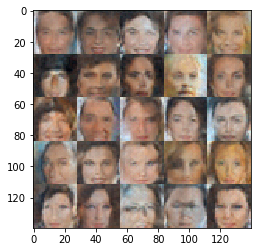

Epoch:  232.0
d_loss:  1.26294
g_loss:  0.553698
Epoch:  233.0
d_loss:  1.39145
g_loss:  0.506848
Epoch:  234.0
d_loss:  1.59754
g_loss:  0.401445
Epoch:  235.0
d_loss:  1.62026
g_loss:  0.654739
Epoch:  236.0
d_loss:  1.23805
g_loss:  0.889602
Epoch:  237.0
d_loss:  1.48063
g_loss:  0.534836
d1:  Tensor("generator_39/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_39/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_39/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_39/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_39/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


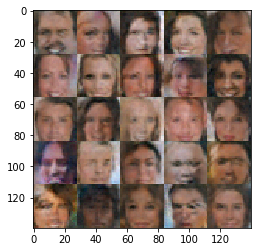

Epoch:  238.0
d_loss:  1.39422
g_loss:  0.565305
Epoch:  239.0
d_loss:  1.36446
g_loss:  0.954278
Epoch:  240.0
d_loss:  1.30651
g_loss:  0.949761
Epoch:  241.0
d_loss:  1.33878
g_loss:  0.704166
Epoch:  242.0
d_loss:  1.55026
g_loss:  0.376039
Epoch:  243.0
d_loss:  1.24145
g_loss:  0.875109
d1:  Tensor("generator_40/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_40/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_40/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_40/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_40/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


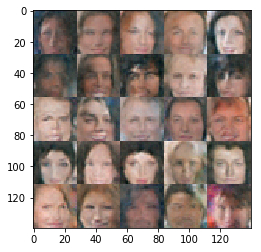

Epoch:  244.0
d_loss:  1.48419
g_loss:  0.597364
Epoch:  245.0
d_loss:  1.30579
g_loss:  0.781315
Epoch:  246.0
d_loss:  1.14152
g_loss:  0.84087
Epoch:  247.0
d_loss:  1.37472
g_loss:  0.999024
Epoch:  248.0
d_loss:  1.47204
g_loss:  0.984002
Epoch:  249.0
d_loss:  1.40108
g_loss:  0.668802
d1:  Tensor("generator_41/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_41/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_41/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_41/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_41/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


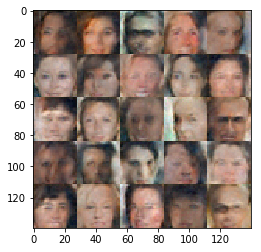

Epoch:  250.0
d_loss:  1.22283
g_loss:  1.20454
Epoch:  251.0
d_loss:  1.23253
g_loss:  0.815227
Epoch:  252.0
d_loss:  1.12538
g_loss:  1.2472
Epoch:  253.0
d_loss:  1.59197
g_loss:  0.423907
Epoch:  254.0
d_loss:  1.32919
g_loss:  0.673885
Epoch:  255.0
d_loss:  1.37982
g_loss:  0.737174
Epoch:  256.0
d_loss:  1.1615
g_loss:  0.996108
d1:  Tensor("generator_42/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_42/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_42/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_42/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_42/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


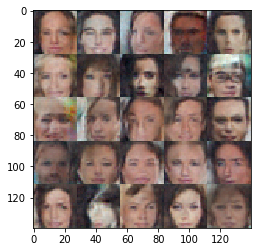

Epoch:  257.0
d_loss:  1.13996
g_loss:  1.09803
Epoch:  258.0
d_loss:  1.85448
g_loss:  0.335783
Epoch:  259.0
d_loss:  1.36664
g_loss:  0.590595
Epoch:  260.0
d_loss:  1.42865
g_loss:  0.563651
Epoch:  261.0
d_loss:  1.46049
g_loss:  0.496407
Epoch:  262.0
d_loss:  1.82609
g_loss:  0.296425
d1:  Tensor("generator_43/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_43/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_43/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_43/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_43/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


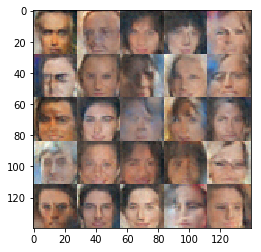

Epoch:  263.0
d_loss:  1.23285
g_loss:  0.468896
Epoch:  264.0
d_loss:  1.26517
g_loss:  0.589244
Epoch:  265.0
d_loss:  1.16491
g_loss:  0.908074
Epoch:  266.0
d_loss:  1.14417
g_loss:  1.02254
Epoch:  267.0
d_loss:  1.4952
g_loss:  0.918997
Epoch:  268.0
d_loss:  1.48364
g_loss:  0.55063
d1:  Tensor("generator_44/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_44/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_44/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_44/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_44/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


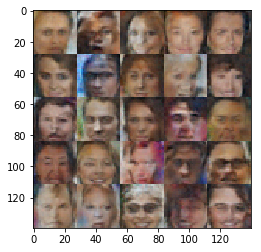

Epoch:  269.0
d_loss:  1.10495
g_loss:  0.785259
Epoch:  270.0
d_loss:  1.42921
g_loss:  0.597703
Epoch:  271.0
d_loss:  1.34991
g_loss:  0.648546
Epoch:  272.0
d_loss:  1.249
g_loss:  0.692998
Epoch:  273.0
d_loss:  1.47309
g_loss:  0.817154
Epoch:  274.0
d_loss:  1.66492
g_loss:  0.49552
d1:  Tensor("generator_45/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_45/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_45/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_45/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_45/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


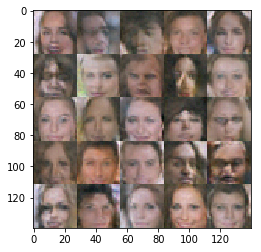

Epoch:  275.0
d_loss:  1.17783
g_loss:  1.19215
Epoch:  276.0
d_loss:  1.80498
g_loss:  0.462972
Epoch:  277.0
d_loss:  1.67013
g_loss:  0.331157
Epoch:  278.0
d_loss:  1.15047
g_loss:  1.04445
Epoch:  279.0
d_loss:  1.17232
g_loss:  0.596605
Epoch:  280.0
d_loss:  1.16379
g_loss:  0.89241
Epoch:  281.0
d_loss:  1.28894
g_loss:  0.557579
d1:  Tensor("generator_46/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_46/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_46/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_46/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_46/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


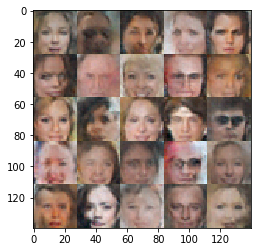

Epoch:  282.0
d_loss:  1.40087
g_loss:  0.592857
Epoch:  283.0
d_loss:  1.30237
g_loss:  0.532087
Epoch:  284.0
d_loss:  1.11843
g_loss:  1.09231
Epoch:  285.0
d_loss:  1.18156
g_loss:  0.78109
Epoch:  286.0
d_loss:  1.05315
g_loss:  0.838134
Epoch:  287.0
d_loss:  1.49976
g_loss:  0.379926
d1:  Tensor("generator_47/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_47/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_47/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_47/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_47/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


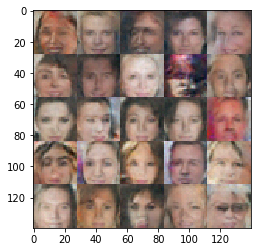

Epoch:  288.0
d_loss:  1.4469
g_loss:  0.573167
Epoch:  289.0
d_loss:  1.54046
g_loss:  0.54169
Epoch:  290.0
d_loss:  1.54261
g_loss:  0.492961
Epoch:  291.0
d_loss:  1.35987
g_loss:  0.563748
Epoch:  292.0
d_loss:  0.990251
g_loss:  1.12723
Epoch:  293.0
d_loss:  1.27349
g_loss:  1.00006
d1:  Tensor("generator_48/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_48/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_48/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_48/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_48/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


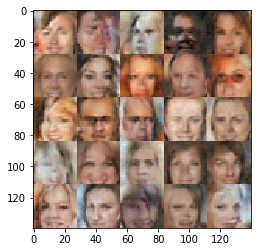

Epoch:  294.0
d_loss:  1.30739
g_loss:  0.887866
Epoch:  295.0
d_loss:  1.20425
g_loss:  0.570554
Epoch:  296.0
d_loss:  1.23986
g_loss:  0.89726
Epoch:  297.0
d_loss:  1.50566
g_loss:  0.839466
Epoch:  298.0
d_loss:  1.41454
g_loss:  0.532569
Epoch:  299.0
d_loss:  1.15893
g_loss:  0.94121
d1:  Tensor("generator_49/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_49/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_49/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_49/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_49/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


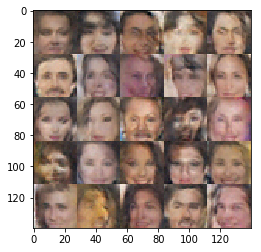

Epoch:  300.0
d_loss:  1.02692
g_loss:  1.08483
Epoch:  301.0
d_loss:  1.09013
g_loss:  0.752784
Epoch:  302.0
d_loss:  1.277
g_loss:  0.549884
Epoch:  303.0
d_loss:  1.24048
g_loss:  0.653591
Epoch:  304.0
d_loss:  1.16594
g_loss:  1.42858
Epoch:  305.0
d_loss:  1.17136
g_loss:  0.660436
Epoch:  306.0
d_loss:  1.11742
g_loss:  0.806174
d1:  Tensor("generator_50/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_50/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_50/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_50/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_50/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


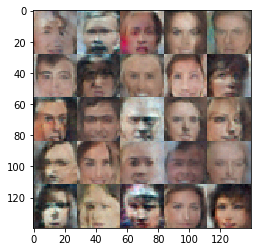

Epoch:  307.0
d_loss:  1.42153
g_loss:  0.542425
Epoch:  308.0
d_loss:  1.94509
g_loss:  1.06914
Epoch:  309.0
d_loss:  1.15259
g_loss:  0.839312
Epoch:  310.0
d_loss:  1.08939
g_loss:  0.822653
Epoch:  311.0
d_loss:  1.31267
g_loss:  0.722537
Epoch:  312.0
d_loss:  1.14056
g_loss:  0.571751
d1:  Tensor("generator_51/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_51/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_51/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_51/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_51/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


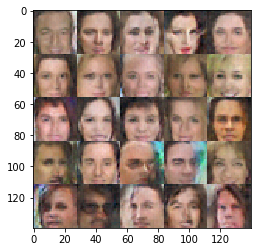

Epoch:  313.0
d_loss:  1.56244
g_loss:  0.35757
Epoch:  314.0
d_loss:  1.47126
g_loss:  0.69385
Epoch:  315.0
d_loss:  1.51242
g_loss:  0.547033
Epoch:  316.0
d_loss:  1.19594
g_loss:  0.794655
Epoch:  317.0
d_loss:  1.31749
g_loss:  0.795053
Epoch:  318.0
d_loss:  0.955058
g_loss:  0.979344
d1:  Tensor("generator_52/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_52/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_52/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_52/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_52/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


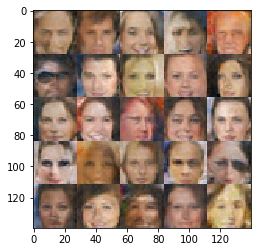

Epoch:  319.0
d_loss:  1.41545
g_loss:  0.463392
Epoch:  320.0
d_loss:  1.54351
g_loss:  0.547749
Epoch:  321.0
d_loss:  1.03342
g_loss:  0.856902
Epoch:  322.0
d_loss:  1.38982
g_loss:  0.706116
Epoch:  323.0
d_loss:  1.05102
g_loss:  1.47228
Epoch:  324.0
d_loss:  1.37193
g_loss:  0.664884
d1:  Tensor("generator_53/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_53/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_53/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_53/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_53/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


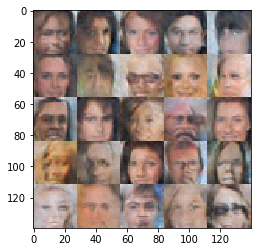

Epoch:  325.0
d_loss:  1.3878
g_loss:  0.666359
Epoch:  326.0
d_loss:  1.65982
g_loss:  0.395434
Epoch:  327.0
d_loss:  1.09837
g_loss:  1.39754
Epoch:  328.0
d_loss:  1.36448
g_loss:  0.56946
Epoch:  329.0
d_loss:  1.29773
g_loss:  0.775962
Epoch:  330.0
d_loss:  1.31896
g_loss:  0.692619
Epoch:  331.0
d_loss:  1.35451
g_loss:  0.818602
d1:  Tensor("generator_54/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_54/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_54/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_54/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_54/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


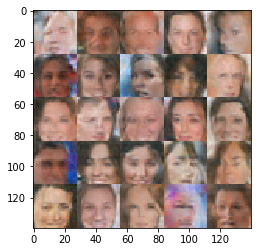

Epoch:  332.0
d_loss:  1.40929
g_loss:  0.590615
Epoch:  333.0
d_loss:  1.42186
g_loss:  0.819611
Epoch:  334.0
d_loss:  1.02717
g_loss:  1.33832
Epoch:  335.0
d_loss:  1.13011
g_loss:  0.976042
Epoch:  336.0
d_loss:  1.42172
g_loss:  0.55288
Epoch:  337.0
d_loss:  1.17448
g_loss:  0.855372
d1:  Tensor("generator_55/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_55/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_55/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_55/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_55/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


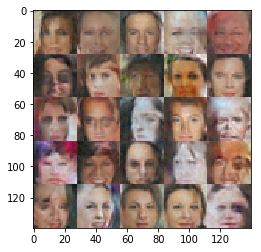

Epoch:  338.0
d_loss:  1.39464
g_loss:  0.89288
Epoch:  339.0
d_loss:  1.30063
g_loss:  1.45802
Epoch:  340.0
d_loss:  0.970042
g_loss:  0.873657
Epoch:  341.0
d_loss:  1.12727
g_loss:  1.08839
Epoch:  342.0
d_loss:  1.72252
g_loss:  0.74835
Epoch:  343.0
d_loss:  1.32358
g_loss:  0.586992
d1:  Tensor("generator_56/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_56/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_56/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_56/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_56/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


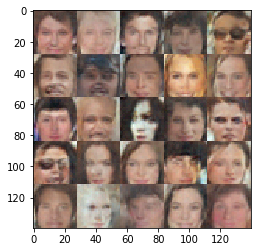

Epoch:  344.0
d_loss:  1.39109
g_loss:  0.558897
Epoch:  345.0
d_loss:  1.32601
g_loss:  0.778688
Epoch:  346.0
d_loss:  1.22261
g_loss:  0.679004
Epoch:  347.0
d_loss:  1.59499
g_loss:  0.4467
Epoch:  348.0
d_loss:  1.22366
g_loss:  0.816025
Epoch:  349.0
d_loss:  1.2557
g_loss:  0.949903
d1:  Tensor("generator_57/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_57/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_57/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_57/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_57/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


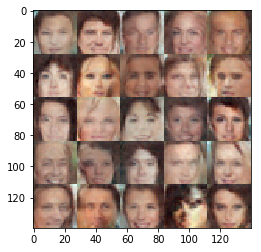

Epoch:  350.0
d_loss:  1.21453
g_loss:  0.683653
Epoch:  351.0
d_loss:  1.91856
g_loss:  0.334708
Epoch:  352.0
d_loss:  1.38316
g_loss:  0.631335
Epoch:  353.0
d_loss:  1.47757
g_loss:  0.513421
Epoch:  354.0
d_loss:  1.19531
g_loss:  0.845106
Epoch:  355.0
d_loss:  1.30931
g_loss:  0.798714
Epoch:  356.0
d_loss:  0.861615
g_loss:  1.52569
d1:  Tensor("generator_58/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_58/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_58/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_58/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_58/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


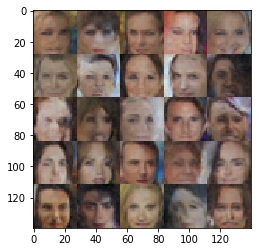

Epoch:  357.0
d_loss:  1.03677
g_loss:  0.705824
Epoch:  358.0
d_loss:  1.04791
g_loss:  1.26453
Epoch:  359.0
d_loss:  1.2326
g_loss:  0.898218
Epoch:  360.0
d_loss:  1.17799
g_loss:  0.6606
Epoch:  361.0
d_loss:  1.11057
g_loss:  0.783922
Epoch:  362.0
d_loss:  0.861339
g_loss:  1.60953
d1:  Tensor("generator_59/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_59/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_59/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_59/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_59/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


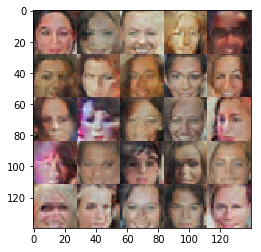

Epoch:  363.0
d_loss:  1.17444
g_loss:  1.19573
Epoch:  364.0
d_loss:  1.08219
g_loss:  1.28957
Epoch:  365.0
d_loss:  1.22194
g_loss:  0.608068
Epoch:  366.0
d_loss:  1.334
g_loss:  0.575035
Epoch:  367.0
d_loss:  1.05087
g_loss:  0.894071
Epoch:  368.0
d_loss:  1.03395
g_loss:  1.25767
d1:  Tensor("generator_60/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_60/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_60/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_60/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_60/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


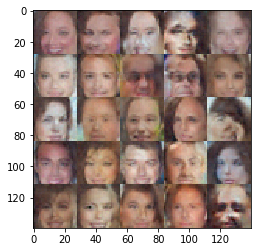

Epoch:  369.0
d_loss:  1.40023
g_loss:  0.602279
Epoch:  370.0
d_loss:  1.2784
g_loss:  1.05523
Epoch:  371.0
d_loss:  1.06292
g_loss:  1.04906
Epoch:  372.0
d_loss:  1.5522
g_loss:  0.503662
Epoch:  373.0
d_loss:  1.51273
g_loss:  0.477298
Epoch:  374.0
d_loss:  1.35733
g_loss:  0.779546
d1:  Tensor("generator_61/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_61/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_61/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_61/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_61/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


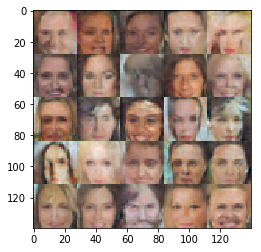

Epoch:  375.0
d_loss:  1.24258
g_loss:  0.958053
Epoch:  376.0
d_loss:  1.39468
g_loss:  0.616245
Epoch:  377.0
d_loss:  0.981837
g_loss:  1.1076
Epoch:  378.0
d_loss:  1.28186
g_loss:  0.59944
Epoch:  379.0
d_loss:  0.964357
g_loss:  0.886617
Epoch:  380.0
d_loss:  1.58677
g_loss:  0.391976
Epoch:  381.0
d_loss:  1.26783
g_loss:  0.556401
d1:  Tensor("generator_62/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_62/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_62/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_62/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_62/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


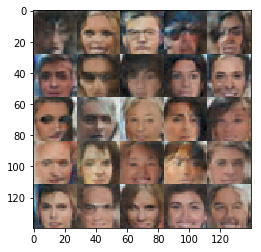

Epoch:  382.0
d_loss:  1.00225
g_loss:  1.13701
Epoch:  383.0
d_loss:  1.14515
g_loss:  0.995329
Epoch:  384.0
d_loss:  1.15043
g_loss:  0.761497
Epoch:  385.0
d_loss:  1.19164
g_loss:  0.892413
Epoch:  386.0
d_loss:  1.17031
g_loss:  0.680635
Epoch:  387.0
d_loss:  1.31134
g_loss:  0.524242
d1:  Tensor("generator_63/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_63/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_63/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_63/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_63/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


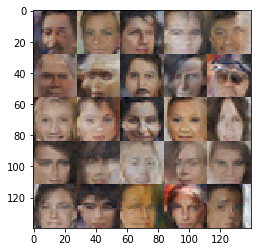

Epoch:  388.0
d_loss:  1.56861
g_loss:  0.434064
Epoch:  389.0
d_loss:  1.71053
g_loss:  0.503205
Epoch:  390.0
d_loss:  1.55625
g_loss:  0.467271
Epoch:  391.0
d_loss:  0.972964
g_loss:  1.33053
Epoch:  392.0
d_loss:  1.33553
g_loss:  0.750561
Epoch:  393.0
d_loss:  1.28593
g_loss:  0.922964
d1:  Tensor("generator_64/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_64/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_64/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_64/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_64/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


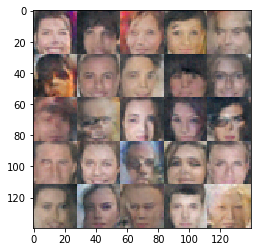

Epoch:  394.0
d_loss:  1.07172
g_loss:  0.920402
Epoch:  395.0
d_loss:  1.03453
g_loss:  0.963204
Epoch:  396.0
d_loss:  1.31836
g_loss:  0.591304
Epoch:  397.0
d_loss:  1.41827
g_loss:  0.537381
Epoch:  398.0
d_loss:  1.21797
g_loss:  0.696467
Epoch:  399.0
d_loss:  1.3854
g_loss:  0.560824
d1:  Tensor("generator_65/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_65/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_65/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_65/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_65/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


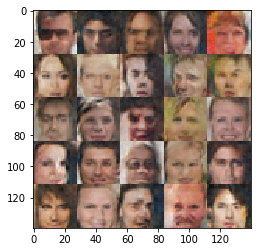

Epoch:  400.0
d_loss:  1.31868
g_loss:  0.625486
Epoch:  401.0
d_loss:  1.33326
g_loss:  0.783544
Epoch:  402.0
d_loss:  0.873644
g_loss:  1.138
Epoch:  403.0
d_loss:  1.18474
g_loss:  0.883298
Epoch:  404.0
d_loss:  1.68989
g_loss:  0.477761
Epoch:  405.0
d_loss:  0.840373
g_loss:  1.44275
Epoch:  406.0
d_loss:  1.45263
g_loss:  0.601483
d1:  Tensor("generator_66/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_66/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_66/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_66/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_66/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


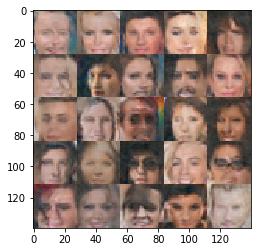

Epoch:  407.0
d_loss:  1.35601
g_loss:  1.72094
Epoch:  408.0
d_loss:  1.14762
g_loss:  0.616015
Epoch:  409.0
d_loss:  1.0819
g_loss:  0.899335
Epoch:  410.0
d_loss:  1.11318
g_loss:  0.837106
Epoch:  411.0
d_loss:  1.20114
g_loss:  0.803499
Epoch:  412.0
d_loss:  1.23783
g_loss:  0.709717
d1:  Tensor("generator_67/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_67/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_67/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_67/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_67/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


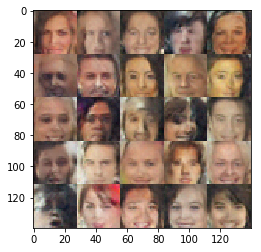

Epoch:  413.0
d_loss:  1.07097
g_loss:  0.85253
Epoch:  414.0
d_loss:  0.853882
g_loss:  0.996097
Epoch:  415.0
d_loss:  1.29985
g_loss:  0.668064
Epoch:  416.0
d_loss:  1.08995
g_loss:  0.894518
Epoch:  417.0
d_loss:  1.22296
g_loss:  0.859602
Epoch:  418.0
d_loss:  1.25742
g_loss:  0.932266
d1:  Tensor("generator_68/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_68/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_68/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_68/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_68/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


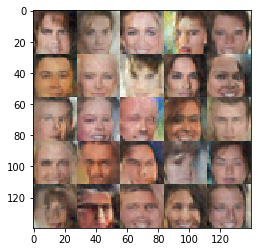

Epoch:  419.0
d_loss:  1.50267
g_loss:  0.35037
Epoch:  420.0
d_loss:  1.02554
g_loss:  0.933187
Epoch:  421.0
d_loss:  1.33183
g_loss:  0.534586
Epoch:  422.0
d_loss:  0.985037
g_loss:  0.861811
Epoch:  423.0
d_loss:  1.24897
g_loss:  0.487454
Epoch:  424.0
d_loss:  1.22091
g_loss:  0.915864
d1:  Tensor("generator_69/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_69/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_69/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_69/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_69/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


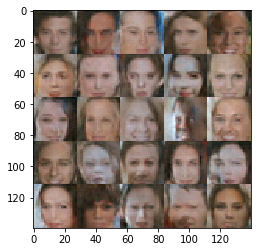

Epoch:  425.0
d_loss:  1.2465
g_loss:  1.09995
Epoch:  426.0
d_loss:  1.23334
g_loss:  0.739528
Epoch:  427.0
d_loss:  1.06315
g_loss:  0.976453
Epoch:  428.0
d_loss:  1.20011
g_loss:  0.538298
Epoch:  429.0
d_loss:  1.20713
g_loss:  0.897564
Epoch:  430.0
d_loss:  1.34799
g_loss:  0.66719
Epoch:  431.0
d_loss:  1.04778
g_loss:  1.10815
d1:  Tensor("generator_70/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_70/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_70/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_70/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_70/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


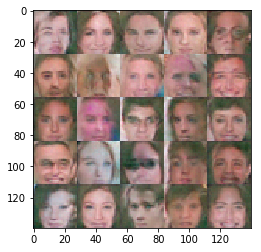

Epoch:  432.0
d_loss:  1.0579
g_loss:  1.26016
Epoch:  433.0
d_loss:  1.08973
g_loss:  0.950024
Epoch:  434.0
d_loss:  1.07841
g_loss:  0.844322
Epoch:  435.0
d_loss:  1.32996
g_loss:  0.617686
Epoch:  436.0
d_loss:  1.19704
g_loss:  0.669269
Epoch:  437.0
d_loss:  1.2416
g_loss:  0.602242
d1:  Tensor("generator_71/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_71/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_71/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_71/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_71/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


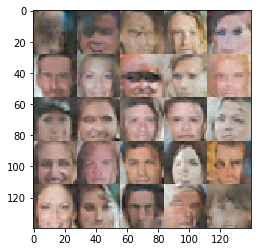

Epoch:  438.0
d_loss:  1.44823
g_loss:  0.913028
Epoch:  439.0
d_loss:  1.21128
g_loss:  1.60603
Epoch:  440.0
d_loss:  1.30268
g_loss:  0.761847
Epoch:  441.0
d_loss:  1.20676
g_loss:  0.898625
Epoch:  442.0
d_loss:  1.11924
g_loss:  0.861292
Epoch:  443.0
d_loss:  1.19958
g_loss:  0.980044
d1:  Tensor("generator_72/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_72/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_72/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_72/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_72/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


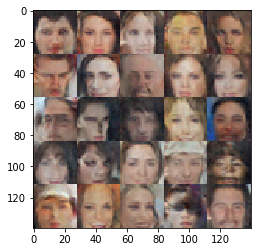

Epoch:  444.0
d_loss:  1.09486
g_loss:  1.05699
Epoch:  445.0
d_loss:  1.31131
g_loss:  0.733937
Epoch:  446.0
d_loss:  1.74676
g_loss:  0.25995
Epoch:  447.0
d_loss:  1.33
g_loss:  0.708526
Epoch:  448.0
d_loss:  1.24858
g_loss:  0.763247
Epoch:  449.0
d_loss:  1.54768
g_loss:  0.590687
d1:  Tensor("generator_73/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_73/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_73/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_73/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_73/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


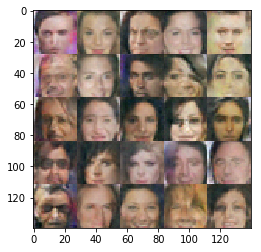

Epoch:  450.0
d_loss:  1.37921
g_loss:  0.51879
Epoch:  451.0
d_loss:  1.45127
g_loss:  0.399577
Epoch:  452.0
d_loss:  1.33603
g_loss:  0.677124
Epoch:  453.0
d_loss:  1.43129
g_loss:  0.459145
Epoch:  454.0
d_loss:  1.0398
g_loss:  1.09772
Epoch:  455.0
d_loss:  1.15968
g_loss:  0.882136
Epoch:  456.0
d_loss:  1.37659
g_loss:  0.750059
d1:  Tensor("generator_74/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_74/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_74/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_74/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_74/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


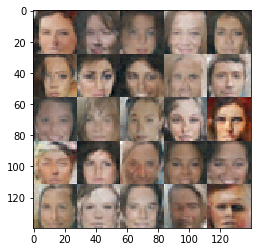

Epoch:  457.0
d_loss:  1.10374
g_loss:  0.92259
Epoch:  458.0
d_loss:  0.862458
g_loss:  1.40243
Epoch:  459.0
d_loss:  1.00965
g_loss:  0.799467
Epoch:  460.0
d_loss:  1.11037
g_loss:  1.29626
Epoch:  461.0
d_loss:  1.43927
g_loss:  0.397743
Epoch:  462.0
d_loss:  1.35618
g_loss:  0.575531
d1:  Tensor("generator_75/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_75/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_75/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_75/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_75/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


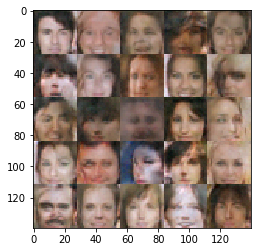

Epoch:  463.0
d_loss:  1.22958
g_loss:  1.2029
Epoch:  464.0
d_loss:  1.48608
g_loss:  0.575492
Epoch:  465.0
d_loss:  1.45377
g_loss:  0.546458
Epoch:  466.0
d_loss:  1.46821
g_loss:  0.494705
Epoch:  467.0
d_loss:  1.21897
g_loss:  0.707458
Epoch:  468.0
d_loss:  1.16727
g_loss:  1.25675
d1:  Tensor("generator_76/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_76/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_76/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_76/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_76/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


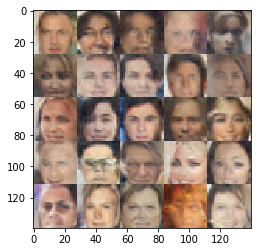

Epoch:  469.0
d_loss:  1.31473
g_loss:  0.934502
Epoch:  470.0
d_loss:  1.73482
g_loss:  0.571881
Epoch:  471.0
d_loss:  1.24022
g_loss:  1.11145
Epoch:  472.0
d_loss:  1.53514
g_loss:  0.54413
Epoch:  473.0
d_loss:  0.941253
g_loss:  0.901553
Epoch:  474.0
d_loss:  1.33526
g_loss:  0.882759
d1:  Tensor("generator_77/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_77/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_77/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_77/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_77/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


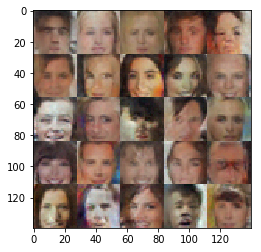

Epoch:  475.0
d_loss:  1.10293
g_loss:  0.782568
Epoch:  476.0
d_loss:  1.39713
g_loss:  0.522116
Epoch:  477.0
d_loss:  1.14413
g_loss:  0.824527
Epoch:  478.0
d_loss:  1.2356
g_loss:  0.758409
Epoch:  479.0
d_loss:  1.52369
g_loss:  0.400347
Epoch:  480.0
d_loss:  1.08867
g_loss:  1.04221
Epoch:  481.0
d_loss:  1.18971
g_loss:  0.877811
d1:  Tensor("generator_78/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_78/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_78/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_78/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_78/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


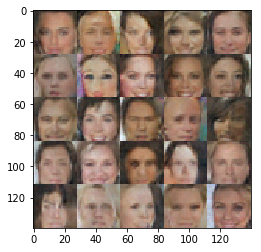

Epoch:  482.0
d_loss:  1.0063
g_loss:  1.30739
Epoch:  483.0
d_loss:  1.35911
g_loss:  0.644291
Epoch:  484.0
d_loss:  1.08798
g_loss:  0.98027
Epoch:  485.0
d_loss:  0.958733
g_loss:  1.16851
Epoch:  486.0
d_loss:  1.38937
g_loss:  0.580086
Epoch:  487.0
d_loss:  0.895935
g_loss:  1.53155
d1:  Tensor("generator_79/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_79/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_79/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_79/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_79/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


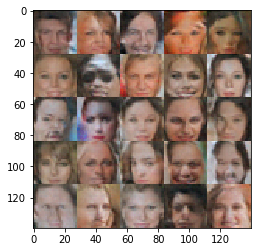

Epoch:  488.0
d_loss:  1.29112
g_loss:  0.82713
Epoch:  489.0
d_loss:  1.41288
g_loss:  0.455754
Epoch:  490.0
d_loss:  1.02819
g_loss:  1.10241
Epoch:  491.0
d_loss:  1.15893
g_loss:  0.919467
Epoch:  492.0
d_loss:  1.12646
g_loss:  0.843983
Epoch:  493.0
d_loss:  1.12402
g_loss:  1.12681
d1:  Tensor("generator_80/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_80/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_80/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_80/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_80/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


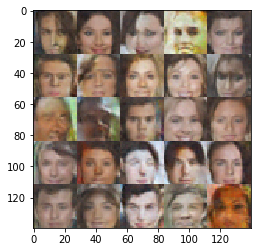

Epoch:  494.0
d_loss:  1.50563
g_loss:  0.629909
Epoch:  495.0
d_loss:  1.37048
g_loss:  0.730724
Epoch:  496.0
d_loss:  1.32036
g_loss:  0.723388
Epoch:  497.0
d_loss:  1.05848
g_loss:  1.30208
Epoch:  498.0
d_loss:  1.74605
g_loss:  0.420425
Epoch:  499.0
d_loss:  1.01103
g_loss:  0.959928
d1:  Tensor("generator_81/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_81/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_81/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_81/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_81/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


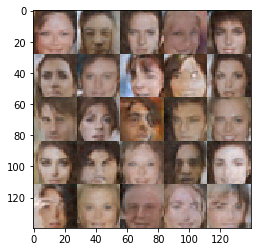

Epoch:  500.0
d_loss:  0.981737
g_loss:  0.94433
Epoch:  501.0
d_loss:  1.3154
g_loss:  0.850823
Epoch:  502.0
d_loss:  1.64091
g_loss:  0.480572
Epoch:  503.0
d_loss:  1.32383
g_loss:  1.49785
Epoch:  504.0
d_loss:  1.26352
g_loss:  0.639787
Epoch:  505.0
d_loss:  1.33324
g_loss:  0.712603
Epoch:  506.0
d_loss:  1.03532
g_loss:  0.876965
d1:  Tensor("generator_82/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_82/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_82/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_82/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_82/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


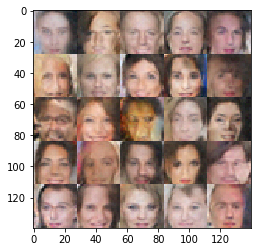

Epoch:  507.0
d_loss:  1.3017
g_loss:  0.706745
Epoch:  508.0
d_loss:  1.06311
g_loss:  1.05328
Epoch:  509.0
d_loss:  1.09188
g_loss:  1.11909
Epoch:  510.0
d_loss:  1.12799
g_loss:  0.839207
Epoch:  511.0
d_loss:  0.980914
g_loss:  1.45587
Epoch:  512.0
d_loss:  1.51937
g_loss:  0.608881
d1:  Tensor("generator_83/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_83/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_83/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_83/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_83/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


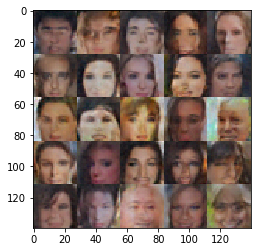

Epoch:  513.0
d_loss:  1.35145
g_loss:  1.42293
Epoch:  514.0
d_loss:  1.14595
g_loss:  0.863923
Epoch:  515.0
d_loss:  1.11001
g_loss:  0.834251
Epoch:  516.0
d_loss:  1.23717
g_loss:  0.46907
Epoch:  517.0
d_loss:  1.46073
g_loss:  0.525781
Epoch:  518.0
d_loss:  1.15871
g_loss:  1.56782
d1:  Tensor("generator_84/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_84/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_84/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_84/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_84/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


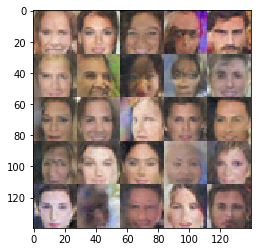

Epoch:  519.0
d_loss:  1.25832
g_loss:  0.698908
Epoch:  520.0
d_loss:  1.4266
g_loss:  0.363767
Epoch:  521.0
d_loss:  1.41263
g_loss:  0.517961
Epoch:  522.0
d_loss:  1.34468
g_loss:  0.614417
Epoch:  523.0
d_loss:  1.46468
g_loss:  0.583886
Epoch:  524.0
d_loss:  1.01325
g_loss:  1.12905
d1:  Tensor("generator_85/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_85/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_85/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_85/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_85/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


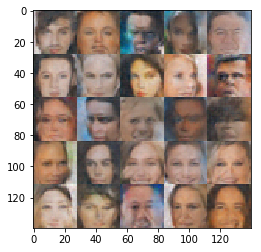

Epoch:  525.0
d_loss:  1.24932
g_loss:  0.711303
Epoch:  526.0
d_loss:  1.45498
g_loss:  0.530385
Epoch:  527.0
d_loss:  1.23171
g_loss:  0.72433
Epoch:  528.0
d_loss:  1.22366
g_loss:  0.591276
Epoch:  529.0
d_loss:  1.25579
g_loss:  0.908179
Epoch:  530.0
d_loss:  0.989969
g_loss:  0.969333
Epoch:  531.0
d_loss:  1.33573
g_loss:  0.654867
d1:  Tensor("generator_86/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_86/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_86/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_86/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_86/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


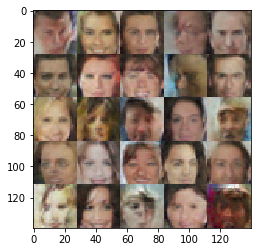

Epoch:  532.0
d_loss:  1.36075
g_loss:  0.791913
Epoch:  533.0
d_loss:  1.35256
g_loss:  0.549213
Epoch:  534.0
d_loss:  1.46008
g_loss:  0.430364
Epoch:  535.0
d_loss:  1.15277
g_loss:  0.821078
Epoch:  536.0
d_loss:  1.31229
g_loss:  1.46999
Epoch:  537.0
d_loss:  1.58267
g_loss:  0.492667
d1:  Tensor("generator_87/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_87/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_87/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_87/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_87/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


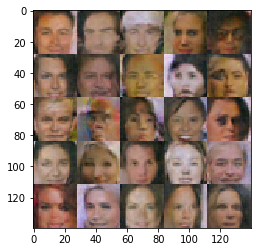

Epoch:  538.0
d_loss:  1.46079
g_loss:  0.869102
Epoch:  539.0
d_loss:  0.933299
g_loss:  1.39615
Epoch:  540.0
d_loss:  0.99957
g_loss:  0.821922
Epoch:  541.0
d_loss:  1.06398
g_loss:  0.642047
Epoch:  542.0
d_loss:  1.06227
g_loss:  1.27134
Epoch:  543.0
d_loss:  1.10787
g_loss:  0.782997
d1:  Tensor("generator_88/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_88/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_88/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_88/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_88/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


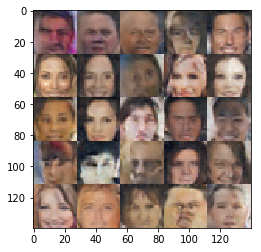

Epoch:  544.0
d_loss:  1.00935
g_loss:  1.25476
Epoch:  545.0
d_loss:  1.04277
g_loss:  1.05092
Epoch:  546.0
d_loss:  1.28113
g_loss:  0.749638
Epoch:  547.0
d_loss:  0.901545
g_loss:  1.1795
Epoch:  548.0
d_loss:  1.66395
g_loss:  0.557465
Epoch:  549.0
d_loss:  1.22509
g_loss:  1.7099
d1:  Tensor("generator_89/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_89/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_89/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_89/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_89/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


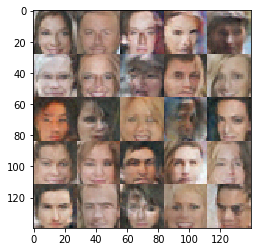

Epoch:  550.0
d_loss:  1.27984
g_loss:  0.894909
Epoch:  551.0
d_loss:  1.83488
g_loss:  0.451838
Epoch:  552.0
d_loss:  1.3479
g_loss:  0.557887
Epoch:  553.0
d_loss:  1.17603
g_loss:  0.792182
Epoch:  554.0
d_loss:  1.24233
g_loss:  0.635196
Epoch:  555.0
d_loss:  1.18668
g_loss:  0.675601
Epoch:  556.0
d_loss:  1.18072
g_loss:  0.795029
d1:  Tensor("generator_90/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_90/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_90/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_90/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_90/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


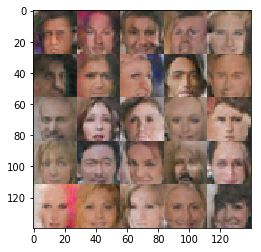

Epoch:  557.0
d_loss:  0.957571
g_loss:  0.949719
Epoch:  558.0
d_loss:  1.11057
g_loss:  0.695611
Epoch:  559.0
d_loss:  1.25754
g_loss:  0.680622
Epoch:  560.0
d_loss:  1.21912
g_loss:  0.993441
Epoch:  561.0
d_loss:  1.25567
g_loss:  0.648751
Epoch:  562.0
d_loss:  1.08815
g_loss:  0.970688
d1:  Tensor("generator_91/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_91/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_91/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_91/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_91/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


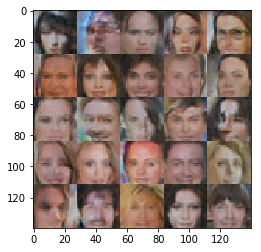

Epoch:  563.0
d_loss:  1.48449
g_loss:  1.00805
Epoch:  564.0
d_loss:  1.2422
g_loss:  0.90464
Epoch:  565.0
d_loss:  1.33133
g_loss:  0.768076
Epoch:  566.0
d_loss:  1.54769
g_loss:  0.622739
Epoch:  567.0
d_loss:  1.00014
g_loss:  0.888039
Epoch:  568.0
d_loss:  1.26299
g_loss:  0.787107
d1:  Tensor("generator_92/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_92/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_92/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_92/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_92/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


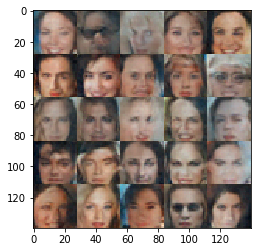

Epoch:  569.0
d_loss:  1.37705
g_loss:  1.09248
Epoch:  570.0
d_loss:  1.26334
g_loss:  1.22142
Epoch:  571.0
d_loss:  1.69435
g_loss:  0.504962
Epoch:  572.0
d_loss:  0.990466
g_loss:  0.946449
Epoch:  573.0
d_loss:  1.26967
g_loss:  1.09031
Epoch:  574.0
d_loss:  1.65741
g_loss:  0.574386
d1:  Tensor("generator_93/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_93/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_93/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_93/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_93/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


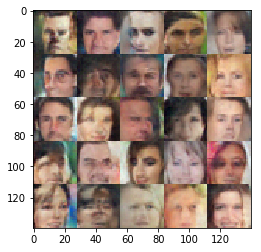

Epoch:  575.0
d_loss:  1.24564
g_loss:  0.622395
Epoch:  576.0
d_loss:  0.80306
g_loss:  1.31239
Epoch:  577.0
d_loss:  1.26082
g_loss:  0.682272
Epoch:  578.0
d_loss:  1.19229
g_loss:  0.865901
Epoch:  579.0
d_loss:  1.42432
g_loss:  0.47027
Epoch:  580.0
d_loss:  1.0815
g_loss:  0.692423
Epoch:  581.0
d_loss:  0.952507
g_loss:  1.0116
d1:  Tensor("generator_94/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_94/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_94/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_94/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_94/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


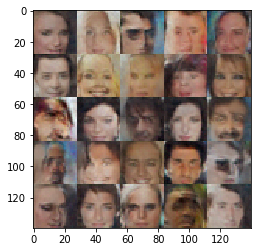

Epoch:  582.0
d_loss:  1.13456
g_loss:  0.566151
Epoch:  583.0
d_loss:  1.534
g_loss:  0.59628
Epoch:  584.0
d_loss:  1.33868
g_loss:  0.799816
Epoch:  585.0
d_loss:  1.37126
g_loss:  0.468747
Epoch:  586.0
d_loss:  1.22267
g_loss:  1.56207
Epoch:  587.0
d_loss:  1.43177
g_loss:  0.532867
d1:  Tensor("generator_95/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_95/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_95/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_95/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_95/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


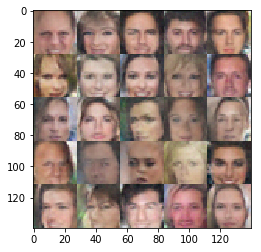

Epoch:  588.0
d_loss:  2.08506
g_loss:  0.260037
Epoch:  589.0
d_loss:  1.14686
g_loss:  0.644256
Epoch:  590.0
d_loss:  1.52346
g_loss:  0.550831
Epoch:  591.0
d_loss:  1.47745
g_loss:  0.678766
Epoch:  592.0
d_loss:  1.10611
g_loss:  1.44318
Epoch:  593.0
d_loss:  1.07665
g_loss:  1.27314
d1:  Tensor("generator_96/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_96/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_96/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_96/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_96/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


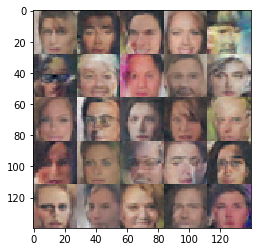

Epoch:  594.0
d_loss:  1.36356
g_loss:  0.847036
Epoch:  595.0
d_loss:  1.32022
g_loss:  2.09337
Epoch:  596.0
d_loss:  0.82871
g_loss:  1.53316
Epoch:  597.0
d_loss:  0.873988
g_loss:  1.11086
Epoch:  598.0
d_loss:  1.12353
g_loss:  0.715594
Epoch:  599.0
d_loss:  1.06068
g_loss:  1.20502
d1:  Tensor("generator_97/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_97/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_97/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_97/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_97/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


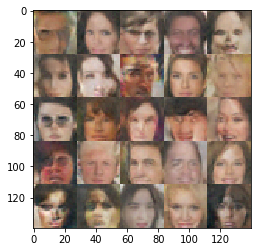

Epoch:  600.0
d_loss:  1.93747
g_loss:  0.289905
Epoch:  601.0
d_loss:  0.875211
g_loss:  1.30324
Epoch:  602.0
d_loss:  1.4959
g_loss:  0.462852
Epoch:  603.0
d_loss:  1.58868
g_loss:  0.441873
Epoch:  604.0
d_loss:  1.05031
g_loss:  1.44916
Epoch:  605.0
d_loss:  1.07376
g_loss:  1.08505
Epoch:  606.0
d_loss:  1.14063
g_loss:  0.653452
d1:  Tensor("generator_98/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_98/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_98/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_98/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_98/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


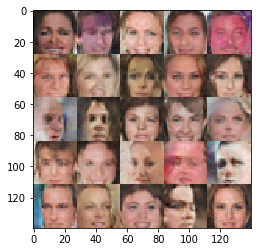

Epoch:  607.0
d_loss:  0.816329
g_loss:  1.61788
Epoch:  608.0
d_loss:  1.14906
g_loss:  1.05259
Epoch:  609.0
d_loss:  1.15393
g_loss:  0.691522
Epoch:  610.0
d_loss:  1.15097
g_loss:  1.33483
Epoch:  611.0
d_loss:  1.10531
g_loss:  0.84249
Epoch:  612.0
d_loss:  1.04089
g_loss:  0.795714
d1:  Tensor("generator_99/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_99/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_99/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_99/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_99/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


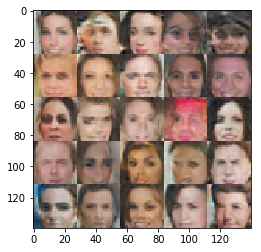

Epoch:  613.0
d_loss:  1.46605
g_loss:  0.567431
Epoch:  614.0
d_loss:  1.37271
g_loss:  0.610089
Epoch:  615.0
d_loss:  1.08514
g_loss:  1.02313
Epoch:  616.0
d_loss:  0.965665
g_loss:  0.853812
Epoch:  617.0
d_loss:  1.22759
g_loss:  0.681552
Epoch:  618.0
d_loss:  1.1361
g_loss:  0.934479
d1:  Tensor("generator_100/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_100/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_100/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_100/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_100/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


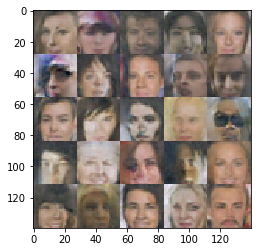

Epoch:  619.0
d_loss:  1.02453
g_loss:  1.76888
Epoch:  620.0
d_loss:  1.48075
g_loss:  0.430787
Epoch:  621.0
d_loss:  1.04537
g_loss:  1.07611
Epoch:  622.0
d_loss:  1.1747
g_loss:  0.985167
Epoch:  623.0
d_loss:  1.28878
g_loss:  0.733411
Epoch:  624.0
d_loss:  1.07004
g_loss:  1.05522
d1:  Tensor("generator_101/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_101/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_101/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_101/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_101/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


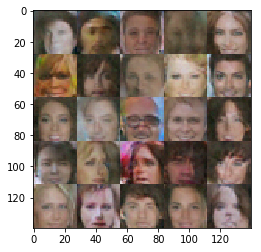

Epoch:  625.0
d_loss:  1.04021
g_loss:  1.12074
Epoch:  626.0
d_loss:  1.21555
g_loss:  0.938653
Epoch:  627.0
d_loss:  1.17255
g_loss:  0.753714
Epoch:  628.0
d_loss:  1.32647
g_loss:  0.879274
Epoch:  629.0
d_loss:  1.08516
g_loss:  1.37251
Epoch:  630.0
d_loss:  1.32601
g_loss:  0.679273
Epoch:  631.0
d_loss:  1.17581
g_loss:  0.778569
d1:  Tensor("generator_102/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_102/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_102/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_102/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_102/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


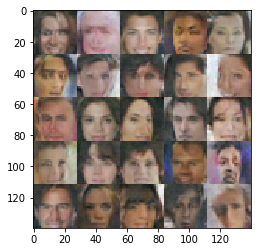

Epoch:  632.0
d_loss:  1.11698
g_loss:  1.04161
Epoch:  633.0
d_loss:  1.30486
g_loss:  0.771085
Epoch:  634.0
d_loss:  1.08722
g_loss:  0.665615
Epoch:  635.0
d_loss:  1.0572
g_loss:  0.914167
Epoch:  636.0
d_loss:  1.16025
g_loss:  0.792273
Epoch:  637.0
d_loss:  1.20681
g_loss:  0.800319
d1:  Tensor("generator_103/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_103/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_103/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_103/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_103/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


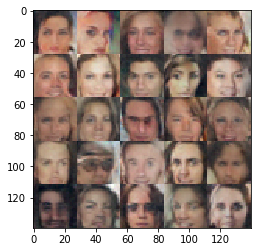

Epoch:  638.0
d_loss:  1.04407
g_loss:  0.687595
Epoch:  639.0
d_loss:  1.21689
g_loss:  0.644714
Epoch:  640.0
d_loss:  1.47442
g_loss:  0.532471
Epoch:  641.0
d_loss:  1.04293
g_loss:  1.07724
Epoch:  642.0
d_loss:  1.37031
g_loss:  0.575575
Epoch:  643.0
d_loss:  1.32568
g_loss:  0.561473
d1:  Tensor("generator_104/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_104/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_104/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_104/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_104/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


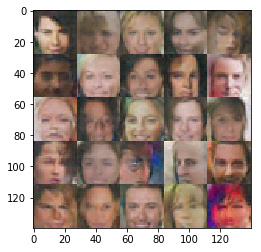

Epoch:  644.0
d_loss:  1.2164
g_loss:  0.645574
Epoch:  645.0
d_loss:  1.09984
g_loss:  0.888008
Epoch:  646.0
d_loss:  1.0614
g_loss:  0.978459
Epoch:  647.0
d_loss:  0.955065
g_loss:  0.986926
Epoch:  648.0
d_loss:  0.888777
g_loss:  1.07287
Epoch:  649.0
d_loss:  1.65104
g_loss:  0.446559
d1:  Tensor("generator_105/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_105/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_105/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_105/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_105/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


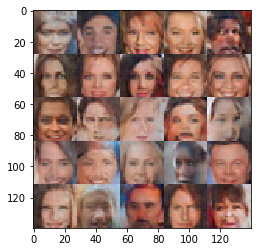

Epoch:  650.0
d_loss:  1.13738
g_loss:  0.919034
Epoch:  651.0
d_loss:  1.2256
g_loss:  0.777312
Epoch:  652.0
d_loss:  1.20982
g_loss:  0.807434
Epoch:  653.0
d_loss:  0.984602
g_loss:  0.937642
Epoch:  654.0
d_loss:  1.47682
g_loss:  0.524031
Epoch:  655.0
d_loss:  1.14791
g_loss:  0.891948
Epoch:  656.0
d_loss:  1.5192
g_loss:  0.324631
d1:  Tensor("generator_106/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_106/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_106/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_106/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_106/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


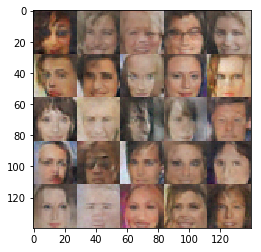

Epoch:  657.0
d_loss:  0.985223
g_loss:  1.21768
Epoch:  658.0
d_loss:  1.29366
g_loss:  0.4786
Epoch:  659.0
d_loss:  0.888478
g_loss:  1.51521
Epoch:  660.0
d_loss:  1.15236
g_loss:  0.461337
Epoch:  661.0
d_loss:  1.17917
g_loss:  0.908296
Epoch:  662.0
d_loss:  1.30061
g_loss:  1.47724
d1:  Tensor("generator_107/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_107/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_107/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_107/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_107/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


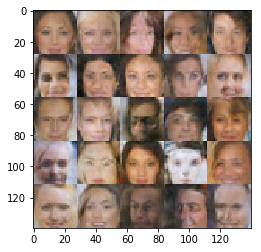

Epoch:  663.0
d_loss:  0.846803
g_loss:  1.54848
Epoch:  664.0
d_loss:  1.11648
g_loss:  1.13433
Epoch:  665.0
d_loss:  1.02705
g_loss:  0.851431
Epoch:  666.0
d_loss:  1.35408
g_loss:  0.572253
Epoch:  667.0
d_loss:  1.13177
g_loss:  1.00199
Epoch:  668.0
d_loss:  1.27668
g_loss:  0.674108
d1:  Tensor("generator_108/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_108/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_108/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_108/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_108/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


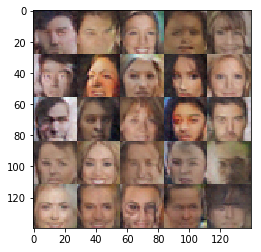

Epoch:  669.0
d_loss:  1.2594
g_loss:  0.937516
Epoch:  670.0
d_loss:  1.67008
g_loss:  0.493918
Epoch:  671.0
d_loss:  1.3834
g_loss:  1.47499
Epoch:  672.0
d_loss:  1.04144
g_loss:  1.17657
Epoch:  673.0
d_loss:  0.920223
g_loss:  1.0985
Epoch:  674.0
d_loss:  1.04887
g_loss:  0.894266
d1:  Tensor("generator_109/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_109/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_109/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_109/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_109/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


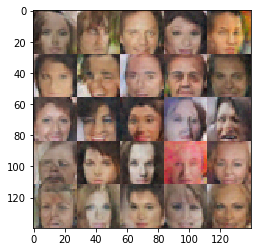

Epoch:  675.0
d_loss:  0.965948
g_loss:  0.974381
Epoch:  676.0
d_loss:  1.19577
g_loss:  0.48611
Epoch:  677.0
d_loss:  0.969348
g_loss:  1.64549
Epoch:  678.0
d_loss:  1.04776
g_loss:  1.2416
Epoch:  679.0
d_loss:  1.09727
g_loss:  0.810053
Epoch:  680.0
d_loss:  1.16699
g_loss:  0.666235
Epoch:  681.0
d_loss:  0.853685
g_loss:  1.05155
d1:  Tensor("generator_110/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_110/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_110/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_110/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_110/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


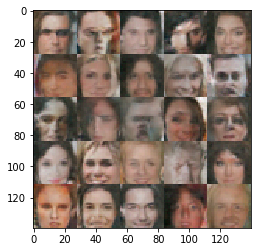

Epoch:  682.0
d_loss:  1.03182
g_loss:  0.912352
Epoch:  683.0
d_loss:  1.38788
g_loss:  1.2603
Epoch:  684.0
d_loss:  1.20517
g_loss:  0.963002
Epoch:  685.0
d_loss:  0.892636
g_loss:  1.1785
Epoch:  686.0
d_loss:  1.33637
g_loss:  0.680255
Epoch:  687.0
d_loss:  0.938539
g_loss:  0.960962
d1:  Tensor("generator_111/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_111/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_111/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_111/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_111/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


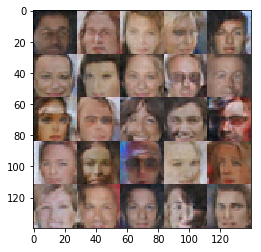

Epoch:  688.0
d_loss:  0.691806
g_loss:  1.4052
Epoch:  689.0
d_loss:  2.27626
g_loss:  2.11106
Epoch:  690.0
d_loss:  0.912347
g_loss:  1.27869
Epoch:  691.0
d_loss:  1.28672
g_loss:  0.894834
Epoch:  692.0
d_loss:  0.910234
g_loss:  1.08994
Epoch:  693.0
d_loss:  1.35319
g_loss:  0.557603
d1:  Tensor("generator_112/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_112/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_112/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_112/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_112/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


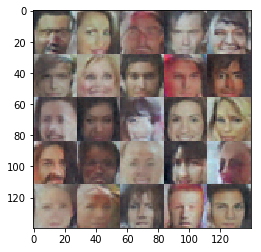

Epoch:  694.0
d_loss:  0.977418
g_loss:  0.953288
Epoch:  695.0
d_loss:  1.11209
g_loss:  2.78929
Epoch:  696.0
d_loss:  1.02443
g_loss:  1.07366
Epoch:  697.0
d_loss:  0.807235
g_loss:  1.36401
Epoch:  698.0
d_loss:  0.957665
g_loss:  1.13175
Epoch:  699.0
d_loss:  1.31598
g_loss:  1.06599
d1:  Tensor("generator_113/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_113/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_113/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_113/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_113/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


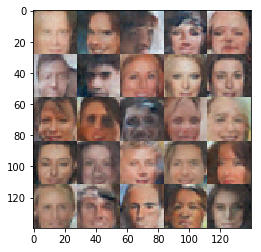

Epoch:  700.0
d_loss:  1.30231
g_loss:  0.680353
Epoch:  701.0
d_loss:  1.4742
g_loss:  0.403561
Epoch:  702.0
d_loss:  0.818749
g_loss:  1.04527
Epoch:  703.0
d_loss:  0.943193
g_loss:  1.63333
Epoch:  704.0
d_loss:  1.14951
g_loss:  1.02422
Epoch:  705.0
d_loss:  1.00225
g_loss:  0.891679
Epoch:  706.0
d_loss:  1.41119
g_loss:  0.472372
d1:  Tensor("generator_114/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_114/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_114/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_114/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_114/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


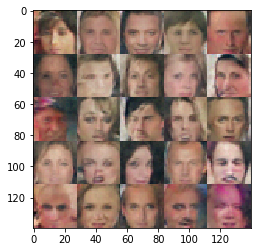

Epoch:  707.0
d_loss:  1.34359
g_loss:  0.638563
Epoch:  708.0
d_loss:  1.08588
g_loss:  0.869471
Epoch:  709.0
d_loss:  1.31529
g_loss:  0.857024
Epoch:  710.0
d_loss:  1.00562
g_loss:  1.04682
Epoch:  711.0
d_loss:  0.876924
g_loss:  1.65873
Epoch:  712.0
d_loss:  1.31381
g_loss:  0.599421
d1:  Tensor("generator_115/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_115/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_115/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_115/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_115/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


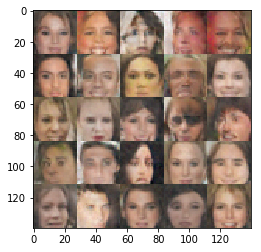

Epoch:  713.0
d_loss:  1.32483
g_loss:  0.447104
Epoch:  714.0
d_loss:  0.888682
g_loss:  1.9068
Epoch:  715.0
d_loss:  1.46117
g_loss:  0.496622
Epoch:  716.0
d_loss:  1.13826
g_loss:  1.50551
Epoch:  717.0
d_loss:  1.2604
g_loss:  0.719381
Epoch:  718.0
d_loss:  1.17105
g_loss:  1.3276
d1:  Tensor("generator_116/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_116/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_116/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_116/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_116/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


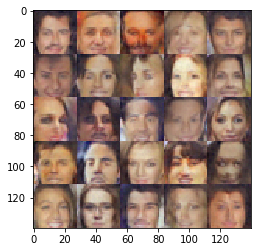

Epoch:  719.0
d_loss:  1.3114
g_loss:  0.53513
Epoch:  720.0
d_loss:  1.18123
g_loss:  0.592438
Epoch:  721.0
d_loss:  1.14235
g_loss:  0.843536
Epoch:  722.0
d_loss:  1.00669
g_loss:  0.83995
Epoch:  723.0
d_loss:  1.00981
g_loss:  1.03006
Epoch:  724.0
d_loss:  0.97666
g_loss:  1.14189
d1:  Tensor("generator_117/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_117/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_117/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_117/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_117/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


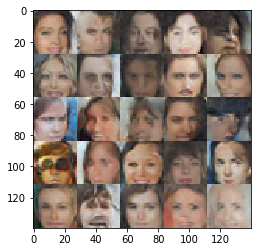

Epoch:  725.0
d_loss:  0.970407
g_loss:  2.49067
Epoch:  726.0
d_loss:  0.876616
g_loss:  0.855696
Epoch:  727.0
d_loss:  1.12382
g_loss:  1.31635
Epoch:  728.0
d_loss:  1.02771
g_loss:  1.066
Epoch:  729.0
d_loss:  1.0125
g_loss:  0.912651
Epoch:  730.0
d_loss:  1.10858
g_loss:  1.03668
Epoch:  731.0
d_loss:  1.71866
g_loss:  0.364949
d1:  Tensor("generator_118/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_118/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_118/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_118/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_118/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


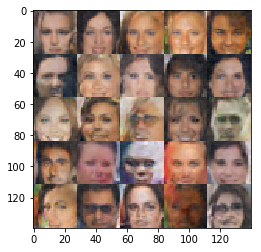

Epoch:  732.0
d_loss:  1.07349
g_loss:  2.25662
Epoch:  733.0
d_loss:  0.976429
g_loss:  1.00594
Epoch:  734.0
d_loss:  1.05775
g_loss:  0.935188
Epoch:  735.0
d_loss:  0.92782
g_loss:  1.7738
Epoch:  736.0
d_loss:  0.936
g_loss:  1.14571
Epoch:  737.0
d_loss:  1.10415
g_loss:  1.25387
d1:  Tensor("generator_119/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_119/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_119/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_119/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_119/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


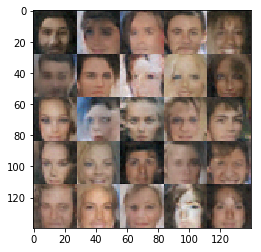

Epoch:  738.0
d_loss:  1.02586
g_loss:  1.03687
Epoch:  739.0
d_loss:  0.896935
g_loss:  1.48929
Epoch:  740.0
d_loss:  0.896367
g_loss:  1.2102
Epoch:  741.0
d_loss:  0.698682
g_loss:  1.80924
Epoch:  742.0
d_loss:  0.893781
g_loss:  1.45711
Epoch:  743.0
d_loss:  1.20026
g_loss:  0.784431
d1:  Tensor("generator_120/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_120/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_120/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_120/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_120/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


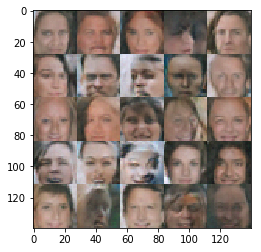

Epoch:  744.0
d_loss:  0.97716
g_loss:  1.10927
Epoch:  745.0
d_loss:  1.35043
g_loss:  0.756449
Epoch:  746.0
d_loss:  1.0724
g_loss:  0.837678
Epoch:  747.0
d_loss:  1.25315
g_loss:  0.69347
Epoch:  748.0
d_loss:  1.20379
g_loss:  0.936049
Epoch:  749.0
d_loss:  0.814882
g_loss:  1.53865
d1:  Tensor("generator_121/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_121/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_121/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_121/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_121/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


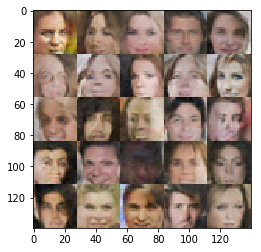

Epoch:  750.0
d_loss:  0.956087
g_loss:  1.09654
Epoch:  751.0
d_loss:  0.622193
g_loss:  1.78178
Epoch:  752.0
d_loss:  1.34686
g_loss:  0.638783
Epoch:  753.0
d_loss:  0.971645
g_loss:  1.50195
Epoch:  754.0
d_loss:  1.17797
g_loss:  0.825837
Epoch:  755.0
d_loss:  1.12497
g_loss:  1.43512
Epoch:  756.0
d_loss:  1.33155
g_loss:  0.588794
d1:  Tensor("generator_122/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_122/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_122/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_122/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_122/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


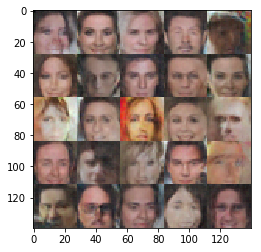

Epoch:  757.0
d_loss:  1.46133
g_loss:  0.467166
Epoch:  758.0
d_loss:  0.925711
g_loss:  0.905845
Epoch:  759.0
d_loss:  1.09733
g_loss:  0.680519
Epoch:  760.0
d_loss:  1.01342
g_loss:  1.28765
Epoch:  761.0
d_loss:  1.14214
g_loss:  0.871098
Epoch:  762.0
d_loss:  0.760012
g_loss:  1.43787
d1:  Tensor("generator_123/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_123/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_123/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_123/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_123/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


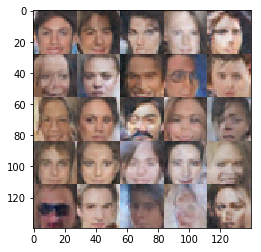

Epoch:  763.0
d_loss:  1.04624
g_loss:  0.70204
Epoch:  764.0
d_loss:  1.13175
g_loss:  0.82764
Epoch:  765.0
d_loss:  0.918691
g_loss:  1.31866
Epoch:  766.0
d_loss:  1.20052
g_loss:  0.602374
Epoch:  767.0
d_loss:  1.22877
g_loss:  0.52915
Epoch:  768.0
d_loss:  1.55278
g_loss:  0.526757
d1:  Tensor("generator_124/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_124/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_124/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_124/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_124/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


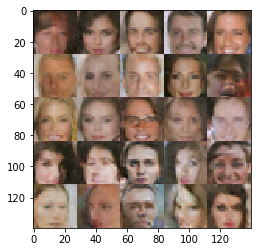

Epoch:  769.0
d_loss:  0.839114
g_loss:  1.74661
Epoch:  770.0
d_loss:  0.811647
g_loss:  0.953923
Epoch:  771.0
d_loss:  0.938153
g_loss:  1.06589
Epoch:  772.0
d_loss:  1.50836
g_loss:  0.552914
Epoch:  773.0
d_loss:  0.785068
g_loss:  1.51612
Epoch:  774.0
d_loss:  1.18897
g_loss:  1.12918
d1:  Tensor("generator_125/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_125/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_125/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_125/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_125/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


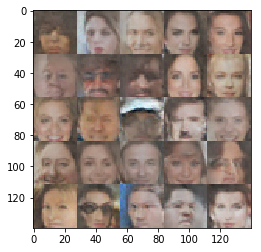

Epoch:  775.0
d_loss:  1.07573
g_loss:  0.64555
Epoch:  776.0
d_loss:  1.07053
g_loss:  1.34302
Epoch:  777.0
d_loss:  0.911967
g_loss:  0.899012
Epoch:  778.0
d_loss:  0.802262
g_loss:  1.4694
Epoch:  779.0
d_loss:  1.20121
g_loss:  0.646446
Epoch:  780.0
d_loss:  2.0925
g_loss:  0.360488
Epoch:  781.0
d_loss:  1.00869
g_loss:  1.0763
d1:  Tensor("generator_126/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_126/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_126/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_126/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_126/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


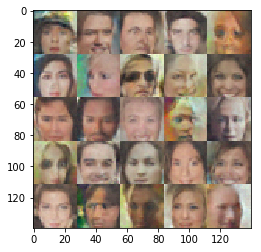

Epoch:  782.0
d_loss:  0.816045
g_loss:  1.6395
Epoch:  783.0
d_loss:  1.42868
g_loss:  0.449326
Epoch:  784.0
d_loss:  1.14459
g_loss:  1.07221
Epoch:  785.0
d_loss:  1.17685
g_loss:  0.630047
Epoch:  786.0
d_loss:  1.27671
g_loss:  0.84173
Epoch:  787.0
d_loss:  0.814887
g_loss:  1.53117
d1:  Tensor("generator_127/dense/BiasAdd:0", shape=(?, 25088), dtype=float32)
l1:  Tensor("generator_127/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
l2:  Tensor("generator_127/dropout_1/mul:0", shape=(?, 14, 14, 256), dtype=float32)
l3:  Tensor("generator_127/dropout_2/mul:0", shape=(?, 28, 28, 128), dtype=float32)
logits:  Tensor("generator_127/conv2d_transpose_3/BiasAdd:0", shape=(?, 28, 28, 3), dtype=float32)


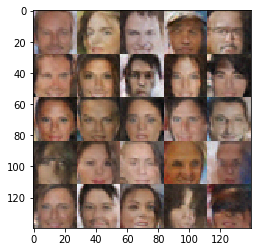

Epoch:  788.0
d_loss:  1.31319
g_loss:  0.60106
Epoch:  789.0
d_loss:  0.825407
g_loss:  1.45164
Epoch:  790.0
d_loss:  0.984604
g_loss:  1.27083
Epoch:  791.0
d_loss:  1.59671
g_loss:  0.567322


In [12]:
batch_size = 16
z_dim = 128
learning_rate = 0.001
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.